# Table 4 and Figure 9

In [ ]:
# This code generates table 4 and Figure 9 in the paper. We have stored the used data for this code in the Data/Table4 folder named as week2229-151sm-merge-result.pkl 

# Reading packages

In [610]:
import pickle
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection
from numpy import mean,std
import scipy.stats as st
from sklearn.model_selection import cross_validate
from math import *
from sklearn.metrics import recall_score,f1_score
import numpy as np
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn import linear_model
from sklearn import tree
from sklearn.svm import LinearSVC
from sklearn.metrics import roc_curve, auc
from scipy import interp
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import BaggingClassifier
import itertools
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn import svm
from sklearn.metrics import roc_auc_score
import sklearn.metrics as metrics
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import hamming_loss, accuracy_score 
from sklearn.model_selection import GridSearchCV
from itertools import cycle

# Reading Data

In [611]:

Pkl_Filename = "week2229-withdiffparams/week2229-151sm-merge-result.pkl"
with open(Pkl_Filename, 'rb') as file:  
    output = pickle.load(file)

output

{'Batch 0': [('dist_users: 0.61',
   '56 seconds ',
   'user_id1: 56',
   'user_id2: 96',
   'min_user1_to_rpi-02: 0.13',
   'max_user1_to_rpi-02: -inf',
   'min_user2_to_rpi-02: 3.1',
   'max_user2_to_rpi-02: -inf',
   'position_x_user1:00.39',
   'position_y_user1:00.39',
   'position_x_user2:425.1',
   'position_y_user2:425.1'),
  ('dist_users: 0.17',
   '54 seconds ',
   'user_id1: 61',
   'user_id2: 90',
   'min_user1_to_rpi-14:  0.17',
   'max_user1_to_rpi-14: 89.87',
   'min_user2_to_rpi-14: 1.1',
   'max_user2_to_rpi-14: 924.52',
   'position_x_user1:0.17',
   'position_y_user1:0.17',
   'position_x_user2:5.2',
   'position_y_user2:5.2'),
  [('2016-09-22 00:00:00', '2016-09-22 00:02:00')]],
 'Batch 1': [('dist_users: 0.8',
   '106 seconds ',
   'user_id1: 61',
   'user_id2: 90',
   'min_user1_to_rpi-14: 0.5',
   'max_user1_to_rpi-14: 69.37',
   'min_user2_to_rpi-14: 0.23',
   'max_user2_to_rpi-14: 328.11',
   'position_x_user1:10.1',
   'position_y_user1:10.1',
   'position_x_u

# Converting to dataframe

In [612]:
def dataframe(input_dict):
    dict_ML=dict()
    for k, v in input_dict.items():
        last_element_list1=v[-1][0][0]
        last_element_list2=v[-1][0][1]
        for t in v:
            if(len(t)!=12 and len(t)>=2):
                first_element_last_list=t[-1][0][0]
                last_element_last_list=t[-1][0][1]
                for f in t:
                    if(len(f)==1):
                        continue
                    
                    if(k not in dict_ML):
                        dict_ML[k]=[]
                        dict_ML[k].append(tuple([f[0],f[1],f[2],f[3],f[4],f[5],f[6],f[7],f[8],f[9],f[10],f[11],first_element_last_list,last_element_last_list]))

                    else:
                        dict_ML[k].append(tuple([f[0],f[1],f[2],f[3],f[4],f[5],f[6],f[7],f[8],f[9],f[10],f[11],first_element_last_list,last_element_last_list]))


            if(len(t)==12):
                if(k not in dict_ML):
                    dict_ML[k]=[]
                    dict_ML[k].append(tuple([t[0],t[1],t[2],t[3],t[4],t[5],t[6],t[7],t[8],t[9],t[10],t[11],last_element_list1,last_element_list2]))
                else:
                    dict_ML[k].append(tuple([t[0],t[1],t[2],t[3],t[4],t[5],t[6],t[7],t[8],t[9],t[10],t[11],last_element_list1,last_element_list2]))
    
            if(len(t)==1):
                continue
    return dict_ML

In [613]:
dict_ML=dataframe(output)
dict_ML

{'Batch 0': [('dist_users: 0.61',
   '56 seconds ',
   'user_id1: 56',
   'user_id2: 96',
   'min_user1_to_rpi-02: 0.13',
   'max_user1_to_rpi-02: -inf',
   'min_user2_to_rpi-02: 3.1',
   'max_user2_to_rpi-02: -inf',
   'position_x_user1:00.39',
   'position_y_user1:00.39',
   'position_x_user2:425.1',
   'position_y_user2:425.1',
   '2016-09-22 00:00:00',
   '2016-09-22 00:02:00'),
  ('dist_users: 0.17',
   '54 seconds ',
   'user_id1: 61',
   'user_id2: 90',
   'min_user1_to_rpi-14:  0.17',
   'max_user1_to_rpi-14: 89.87',
   'min_user2_to_rpi-14: 1.1',
   'max_user2_to_rpi-14: 924.52',
   'position_x_user1:0.17',
   'position_y_user1:0.17',
   'position_x_user2:5.2',
   'position_y_user2:5.2',
   '2016-09-22 00:00:00',
   '2016-09-22 00:02:00')],
 'Batch 1': [('dist_users: 0.8',
   '106 seconds ',
   'user_id1: 61',
   'user_id2: 90',
   'min_user1_to_rpi-14: 0.5',
   'max_user1_to_rpi-14: 69.37',
   'min_user2_to_rpi-14: 0.23',
   'max_user2_to_rpi-14: 328.11',
   'position_x_user1

In [614]:
L = [(k,t[0],t[1],t[2],t[3],t[4],t[5],t[6],t[7],t[8],t[9],t[10],t[11],t[12],t[13]) for k, v in dict_ML.items() for t in v]
df = pd.DataFrame(L, columns=['Batch','distance_user','overlap','user_id1','user_id2','min_user1_to_iot','max_user1_to_iot','min_user2_to_iot','max_user2_to_iot','position_x_user1','position_y_user1','position_x_user2','position_y_user2','start_time_interval','end_time_interval'])
# print (df)

# data processing

In [615]:
df['distance_user'] = df['distance_user'].str.replace('dist_users:','').astype(float)
df['position_x_user1'] = df['position_x_user1'].str.replace('position_x_user1:','').astype(float)
df['position_y_user1'] = df['position_y_user1'].str.replace('position_y_user1:','').astype(float)
df['position_x_user2'] = df['position_x_user2'].str.replace('position_x_user2:','').astype(float)
df['position_y_user2'] = df['position_y_user2'].str.replace('position_y_user2:','').astype(float)
df['overlap'] = df['overlap'].str.replace('seconds','').astype(float)
df['user_id1']=df['user_id1'].str.replace('user_id1:','').astype(float)
df['user_id2']=df['user_id2'].str.replace('user_id2:','').astype(float)
df[['element1','min_user1_to_iot']]=df.min_user1_to_iot.str.split(":",expand=True) 
df[['element2','max_user1_to_iot']]=df.max_user1_to_iot.str.split(":",expand=True) 
df[['element3','min_user2_to_iot']]=df.min_user2_to_iot.str.split(":",expand=True) 
df[['element4','max_user2_to_iot']]=df.max_user2_to_iot.str.split(":",expand=True) 
df.drop(columns=['element1', 'element2','element3','element4'], axis=1, inplace=True)
df['min_user1_to_iot'] = df.min_user1_to_iot.astype(float)
df['max_user1_to_iot'] = df.max_user1_to_iot.astype(float)
df['min_user2_to_iot'] = df.min_user2_to_iot.astype(float)
df['max_user2_to_iot'] = df.max_user2_to_iot.astype(float)
df['range-user1'] = df['max_user1_to_iot'] - df['min_user1_to_iot']
df['range-user2'] = df['max_user2_to_iot'] - df['min_user2_to_iot']
df['mean-user1'] = df[['min_user1_to_iot', 'max_user1_to_iot']].mean(axis=1)
df['mean-user2'] = df[['min_user2_to_iot', 'max_user2_to_iot']].mean(axis=1)

# Label risk function

In [616]:
def approximate_risk(row):
    if (row['distance_user'] <= 2 and row['overlap'] >= 60 ):
        val = 'High Risk'
    elif ((row['distance_user'] >= 6 and row['distance_user'] <= 10 ) and (row['overlap'] >= 3600)):
        val = 'High Risk'
    elif (row['distance_user'] <= 2 and row['overlap'] < 60 ):
        val = 'Medium Risk'
    elif (row['distance_user'] > 2 and row['distance_user'] <= 6 and row['overlap'] >= 3600 ) :
        val = 'High Risk'
    elif (row['distance_user'] > 2 and row['distance_user'] <= 6 and row['overlap'] < 3600 ) :
        val = 'Medium Risk'
    else:
        val = 'Low Risk'
    return val
df['Risk'] = df.apply(approximate_risk, axis=1)
df


,Batch,distance_user,overlap,user_id1,user_id2,min_user1_to_iot,max_user1_to_iot,min_user2_to_iot,max_user2_to_iot,position_x_user1,position_y_user1,position_x_user2,position_y_user2,start_time_interval,end_time_interval,range-user1,range-user2,mean-user1,mean-user2,Risk
0,Batch 0,0.61,56.0,56.0,96.0,0.13,-inf,3.10,-inf,0.39,0.39,425.10,425.10,2016-09-22 00:00:00,2016-09-22 00:02:00,-inf,-inf,-inf,-inf,Medium Risk
1,Batch 0,0.17,54.0,61.0,90.0,0.17,89.87,1.10,924.52,0.17,0.17,5.20,5.20,2016-09-22 00:00:00,2016-09-22 00:02:00,89.70,923.42,45.020,462.81,Medium Risk
2,Batch 1,0.80,106.0,61.0,90.0,0.50,69.37,0.23,328.11,10.10,10.10,10.10,10.10,2016-09-22 00:02:59,2016-09-22 00:04:59,68.87,327.88,34.935,164.17,High Risk
3,Batch 1,0.88,105.0,62.0,90.0,0.65,1197.82,0.23,328.11,0.10,0.10,10.10,10.10,2016-09-22 00:02:59,2016-09-22 00:04:59,1197.17,327.88,599.235,164.17,High Risk
4,Batch 1,0.23,53.0,73.0,90.0,1.10,2605.03,0.23,328.11,0.23,0.23,3.10,3.10,2016-09-22 00:02:59,2016-09-22 00:04:59,2603.93,327.88,1303.065,164.17,Medium Risk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5720,Batch 1370,1.10,20.0,90.0,96.0,11.32,924.52,41.32,1197.82,1.10,1.10,69.37,69.37,2016-09-29 22:14:49,2016-09-29 22:17:04,913.20,1156.50,467.920,619.57,Medium Risk
5721,Batch 1371,4.01,44.0,90.0,96.0,1.84,425.10,116.44,425.10,4.01,4.01,253.25,253.25,2016-09-29 22:18:03,2016-09-29 22:19:03,423.26,308.66,213.470,270.77,Medium Risk
5722,Batch 1372,4.01,22.0,90.0,96.0,1.84,425.10,116.44,425.10,4.01,4.01,69.37,69.37,2016-09-29 22:21:18,2016-09-29 22:30:33,423.26,308.66,213.470,270.77,Medium Risk
5723,Batch 1373,2.62,89.0,90.0,96.0,1.84,425.10,116.44,425.10,11.32,11.32,0.04,0.04,2016-09-29 22:34:03,2016-09-29 22:36:18,423.26,308.66,213.470,270.77,Medium Risk


In [617]:
df=df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
df.reset_index(drop=True, inplace=True)
df

,Batch,distance_user,overlap,user_id1,user_id2,min_user1_to_iot,max_user1_to_iot,min_user2_to_iot,max_user2_to_iot,position_x_user1,position_y_user1,position_x_user2,position_y_user2,start_time_interval,end_time_interval,range-user1,range-user2,mean-user1,mean-user2,Risk
0,Batch 0,0.17,54.0,61.0,90.0,0.17,89.87,1.10,924.52,0.17,0.17,5.20,5.20,2016-09-22 00:00:00,2016-09-22 00:02:00,89.70,923.42,45.020,462.810,Medium Risk
1,Batch 1,0.80,106.0,61.0,90.0,0.50,69.37,0.23,328.11,10.10,10.10,10.10,10.10,2016-09-22 00:02:59,2016-09-22 00:04:59,68.87,327.88,34.935,164.170,High Risk
2,Batch 1,0.88,105.0,62.0,90.0,0.65,1197.82,0.23,328.11,0.10,0.10,10.10,10.10,2016-09-22 00:02:59,2016-09-22 00:04:59,1197.17,327.88,599.235,164.170,High Risk
3,Batch 1,0.23,53.0,73.0,90.0,1.10,2605.03,0.23,328.11,0.23,0.23,3.10,3.10,2016-09-22 00:02:59,2016-09-22 00:04:59,2603.93,327.88,1303.065,164.170,Medium Risk
4,Batch 2,0.41,108.0,61.0,90.0,0.17,150.87,0.30,328.11,0.17,0.17,0.20,0.20,2016-09-22 00:05:58,2016-09-22 00:07:58,150.70,327.81,75.520,164.205,High Risk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,Batch 1370,1.10,20.0,90.0,96.0,11.32,924.52,41.32,1197.82,1.10,1.10,69.37,69.37,2016-09-29 22:14:49,2016-09-29 22:17:04,913.20,1156.50,467.920,619.570,Medium Risk
5720,Batch 1371,4.01,44.0,90.0,96.0,1.84,425.10,116.44,425.10,4.01,4.01,253.25,253.25,2016-09-29 22:18:03,2016-09-29 22:19:03,423.26,308.66,213.470,270.770,Medium Risk
5721,Batch 1372,4.01,22.0,90.0,96.0,1.84,425.10,116.44,425.10,4.01,4.01,69.37,69.37,2016-09-29 22:21:18,2016-09-29 22:30:33,423.26,308.66,213.470,270.770,Medium Risk
5722,Batch 1373,2.62,89.0,90.0,96.0,1.84,425.10,116.44,425.10,11.32,11.32,0.04,0.04,2016-09-29 22:34:03,2016-09-29 22:36:18,423.26,308.66,213.470,270.770,Medium Risk


In [618]:
import pickle
Pkl_Filename = "finaldata.pkl"  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(df, file)

# Reading the dataset 

In [619]:
Pkl_Filename = "finaldata.pkl"
with open(Pkl_Filename, 'rb') as file:  
    df = pickle.load(file)

df.head()

,Batch,distance_user,overlap,user_id1,user_id2,min_user1_to_iot,max_user1_to_iot,min_user2_to_iot,max_user2_to_iot,position_x_user1,position_y_user1,position_x_user2,position_y_user2,start_time_interval,end_time_interval,range-user1,range-user2,mean-user1,mean-user2,Risk
0,Batch 0,0.17,54.0,61.0,90.0,0.17,89.87,1.10,924.52,0.17,0.17,5.2,5.2,2016-09-22 00:00:00,2016-09-22 00:02:00,89.70,923.42,45.020,462.810,Medium Risk
1,Batch 1,0.80,106.0,61.0,90.0,0.50,69.37,0.23,328.11,10.10,10.10,10.1,10.1,2016-09-22 00:02:59,2016-09-22 00:04:59,68.87,327.88,34.935,164.170,High Risk
2,Batch 1,0.88,105.0,62.0,90.0,0.65,1197.82,0.23,328.11,0.10,0.10,10.1,10.1,2016-09-22 00:02:59,2016-09-22 00:04:59,1197.17,327.88,599.235,164.170,High Risk
3,Batch 1,0.23,53.0,73.0,90.0,1.10,2605.03,0.23,328.11,0.23,0.23,3.1,3.1,2016-09-22 00:02:59,2016-09-22 00:04:59,2603.93,327.88,1303.065,164.170,Medium Risk
4,Batch 2,0.41,108.0,61.0,90.0,0.17,150.87,0.30,328.11,0.17,0.17,0.2,0.2,2016-09-22 00:05:58,2016-09-22 00:07:58,150.70,327.81,75.520,164.205,High Risk


# Applying Machine learning models. 

In [620]:
def applying_ML(X_train, Y_train, X_test, Y_test, classifierName, title, depth=None, Cvalue=1,alphaValue=0.3):

    params = {'n_neighbors':[5,6,7,8,9,10],
          'leaf_size':[1,2,3,5],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree','kd_tree','brute'],
          'n_jobs':[-1]}
    
# Binarize the output
    Y_train = label_binarize(Y_train, classes=['Low Risk','Medium Risk', 'High Risk'])
    n_classes = Y_train.shape[1]
    Y_test = label_binarize(Y_test, classes=['Low Risk','Medium Risk', 'High Risk'])
    n=len(X_test)


# Learn to predict each class against the other
    if classifierName=='DecisionTree':
        classifier=OneVsRestClassifier(tree.DecisionTreeClassifier(max_depth=depth))
    elif classifierName=='SVM':
        classifier= OneVsRestClassifier(svm.SVC(probability=True))
    elif classifierName=='Bagging':
        estimator= tree.DecisionTreeClassifier()
        classifier=OneVsRestClassifier(BaggingClassifier(base_estimator=estimator))
    elif classifierName=='XGBoost':
        classifier=OneVsRestClassifier(XGBClassifier( 
                    n_jobs=40,max_depth=20))
    elif classifierName=='KNN':
        classifier=OneVsRestClassifier(KNeighborsClassifier(n_jobs=-1,n_neighbors=5))   
    model=classifier.fit(X_train, Y_train)
    y_score = classifier.fit(X_train, Y_train).predict(X_test)
    pred_score=classifier.predict_proba(X_test)[:,1]
    accuracy=accuracy_score(Y_test, y_score )
#     print("accuracy:",accuracy)


    
    classes=['Low Risk','Medium Risk', 'High Risk']
    cm = confusion_matrix(Y_test.argmax(axis=1), y_score.argmax(axis=1))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100

    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape

    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=classes, columns=classes)
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=(5,5))
    sns.heatmap(cm, annot=annot, fmt='', ax=ax)
    ax.set_title('Confusion Matrix'+ ' ' + title + ' ' + 'Model')
    


# For each class
    precision = dict()
    recall = dict()
    average_precision = dict()
    average_recall = dict()
    f1=dict()
    
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(Y_test[:, i],
                                                        y_score[:, i])
        average_precision[i] = average_precision_score(Y_test[:, i], y_score[:, i])

    precision["micro"], recall["micro"], _ = precision_recall_curve(Y_test.ravel(),
        y_score.ravel())
    average_precision["micro"] = average_precision_score(Y_test, y_score,
                                                     average="micro")
    average_recall["micro"] = recall_score(Y_test, y_score,
                                                     average="micro")
    f1["micro"]=f1_score(Y_test, y_score, average='micro')
        
    macro_roc_auc_ovr = roc_auc_score(Y_test, y_score, multi_class="ovr",
                                  average="macro")

    colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])

    plt.figure(figsize=(7, 8))
    f_scores = np.linspace(0.2, 0.8, num=4)
    lines = []
    labels = []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
    plt.show()

    return (accuracy,n,average_precision["micro"],average_recall["micro"],f1["micro"],macro_roc_auc_ovr)


# Selecting features and target variables. 

In [621]:
feature_cols = ['range-user1','range-user2', 'min_user1_to_iot', 'min_user2_to_iot', 'max_user1_to_iot', 'max_user2_to_iot','position_x_user1','position_y_user1','position_x_user2','position_y_user2','mean-user1','mean-user2']
X = df[feature_cols] # Features
y = df['Risk'] # Target variable

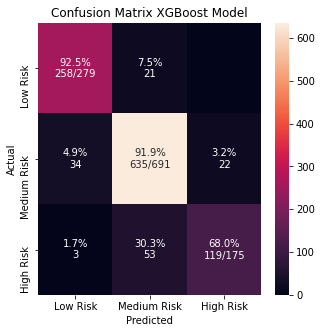

<Figure size 504x576 with 0 Axes>

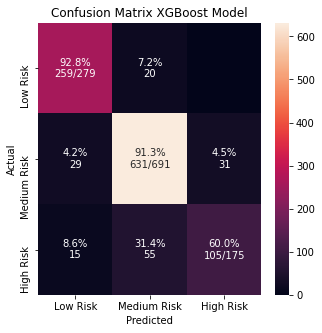

<Figure size 504x576 with 0 Axes>

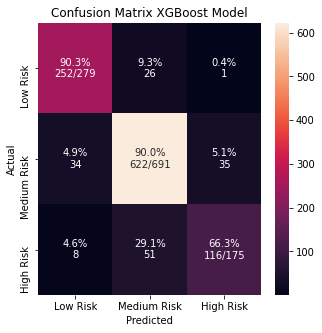

<Figure size 504x576 with 0 Axes>

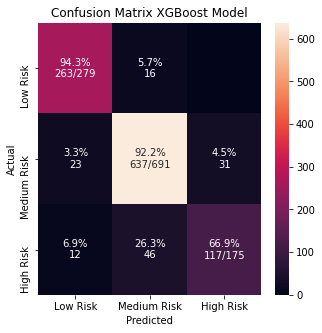

<Figure size 504x576 with 0 Axes>

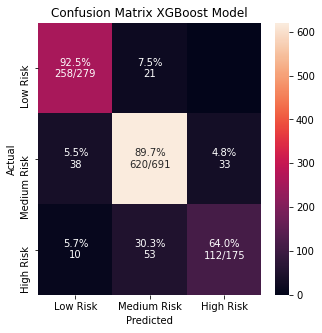

<Figure size 504x576 with 0 Axes>

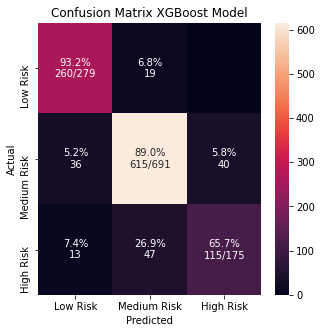

<Figure size 504x576 with 0 Axes>

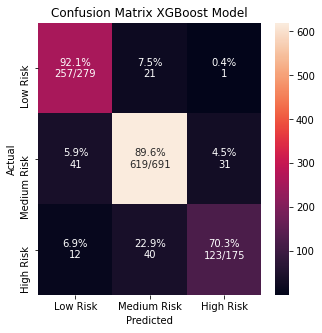

<Figure size 504x576 with 0 Axes>

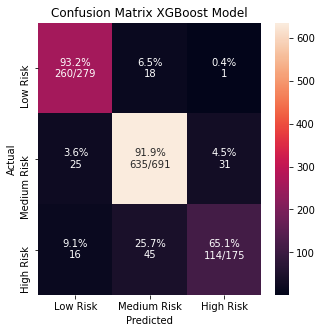

<Figure size 504x576 with 0 Axes>

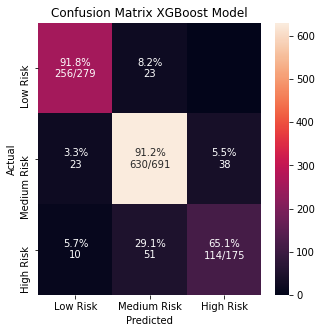

<Figure size 504x576 with 0 Axes>

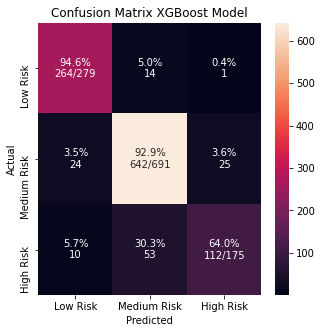

<Figure size 504x576 with 0 Axes>

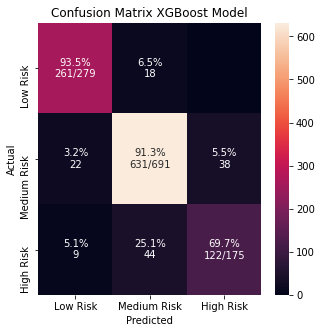

<Figure size 504x576 with 0 Axes>

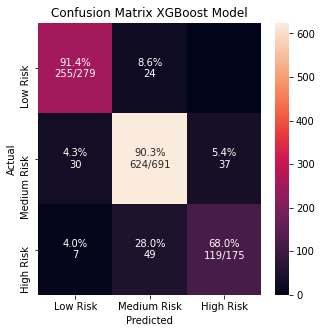

<Figure size 504x576 with 0 Axes>

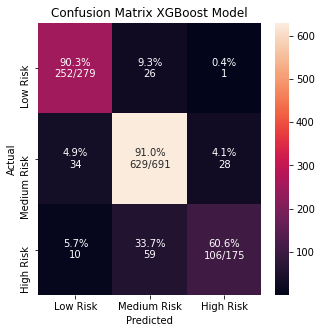

<Figure size 504x576 with 0 Axes>

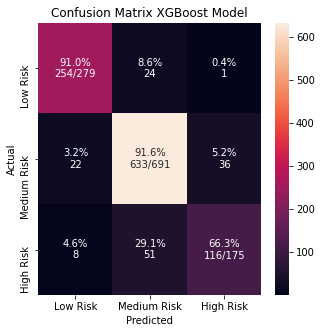

<Figure size 504x576 with 0 Axes>

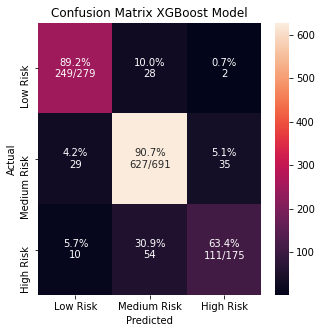

<Figure size 504x576 with 0 Axes>

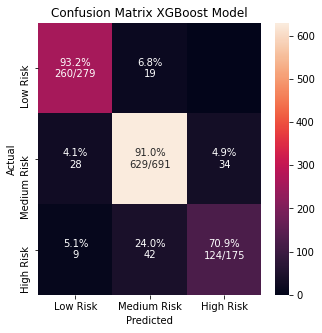

<Figure size 504x576 with 0 Axes>

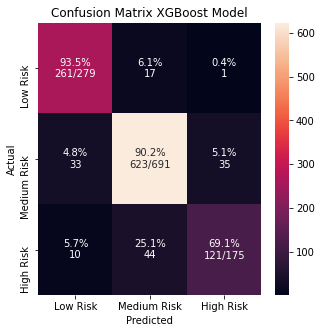

<Figure size 504x576 with 0 Axes>

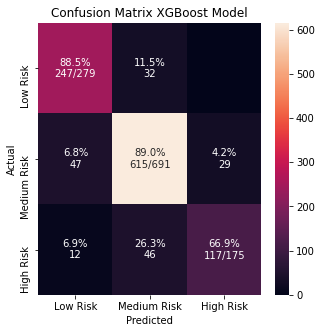

<Figure size 504x576 with 0 Axes>

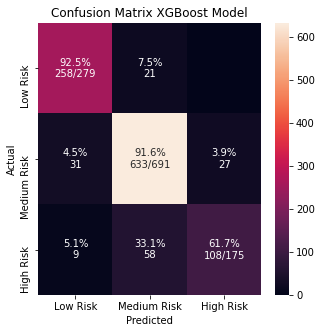

<Figure size 504x576 with 0 Axes>

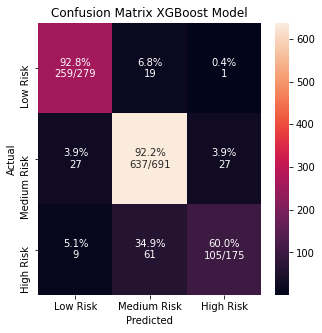

<Figure size 504x576 with 0 Axes>

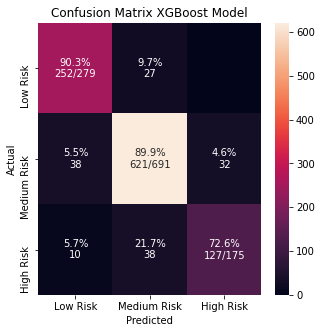

<Figure size 504x576 with 0 Axes>

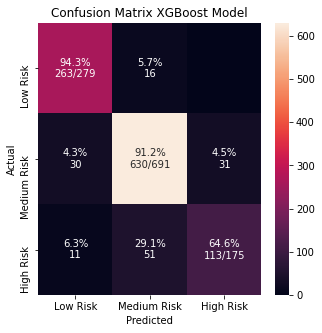

<Figure size 504x576 with 0 Axes>

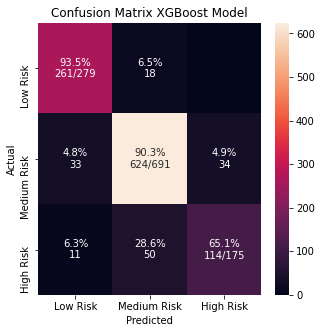

<Figure size 504x576 with 0 Axes>

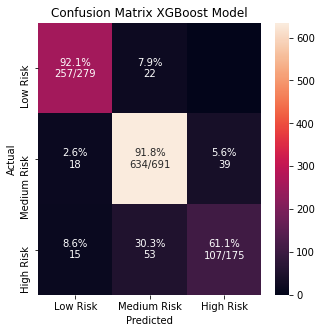

<Figure size 504x576 with 0 Axes>

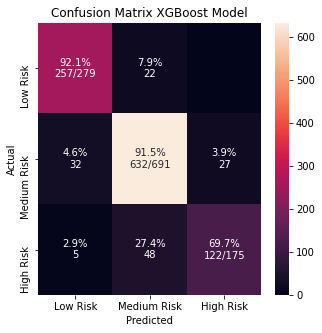

<Figure size 504x576 with 0 Axes>

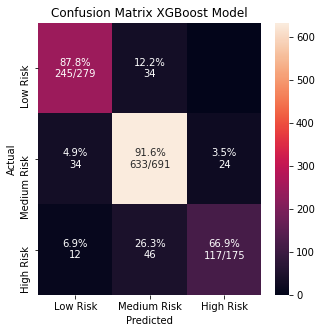

<Figure size 504x576 with 0 Axes>

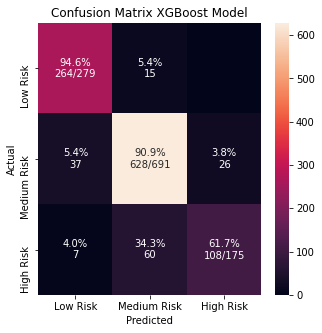

<Figure size 504x576 with 0 Axes>

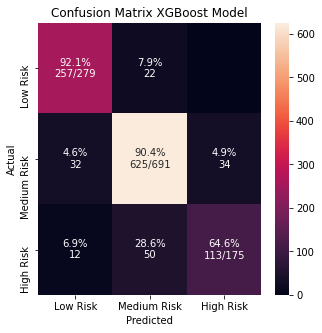

<Figure size 504x576 with 0 Axes>

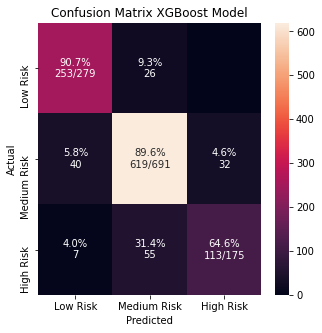

<Figure size 504x576 with 0 Axes>

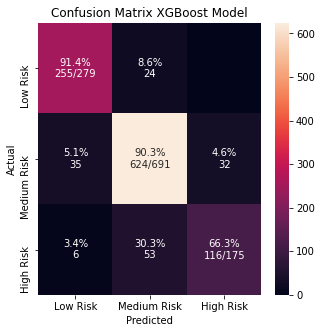

<Figure size 504x576 with 0 Axes>

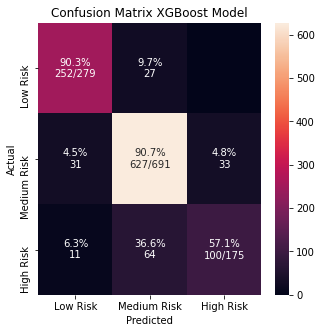

<Figure size 504x576 with 0 Axes>

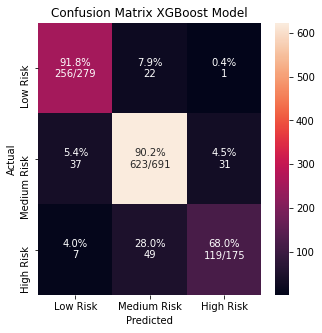

<Figure size 504x576 with 0 Axes>

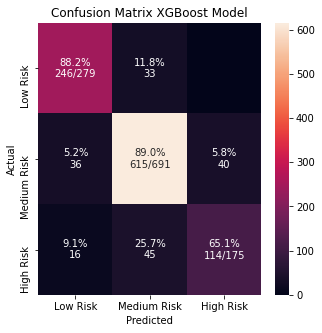

<Figure size 504x576 with 0 Axes>

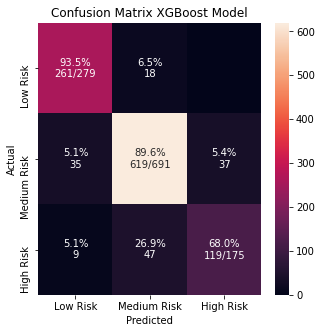

<Figure size 504x576 with 0 Axes>

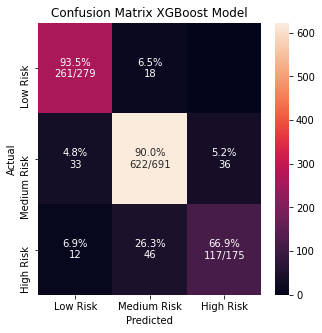

<Figure size 504x576 with 0 Axes>

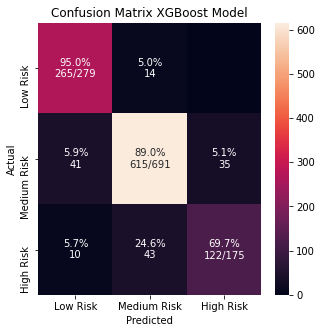

<Figure size 504x576 with 0 Axes>

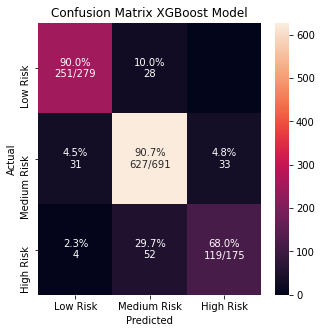

<Figure size 504x576 with 0 Axes>

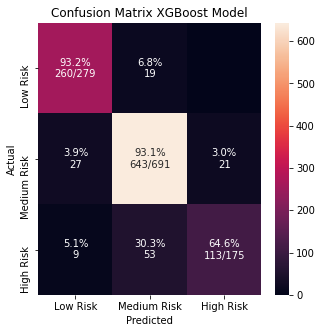

<Figure size 504x576 with 0 Axes>

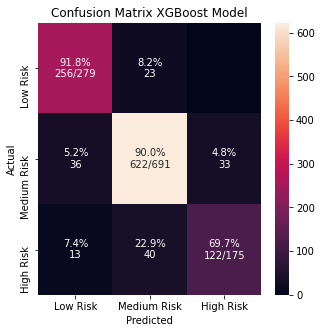

<Figure size 504x576 with 0 Axes>

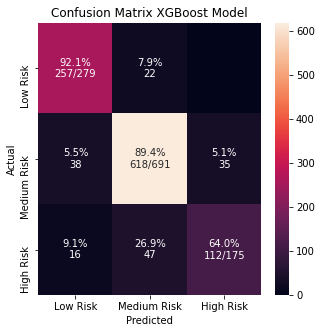

<Figure size 504x576 with 0 Axes>

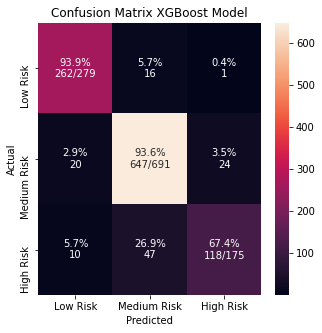

<Figure size 504x576 with 0 Axes>

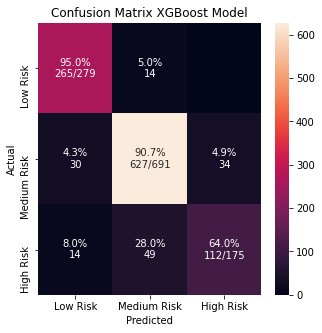

<Figure size 504x576 with 0 Axes>

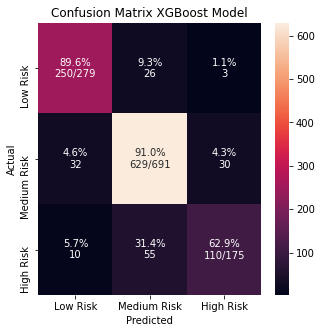

<Figure size 504x576 with 0 Axes>

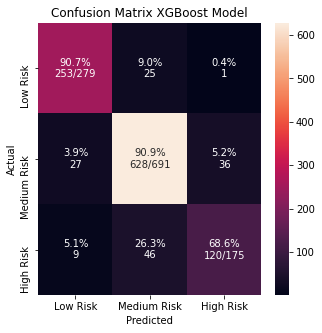

<Figure size 504x576 with 0 Axes>

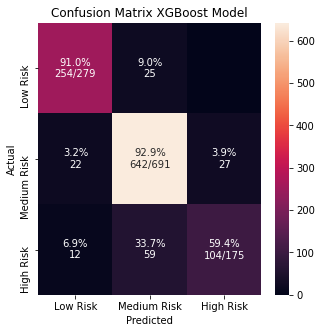

<Figure size 504x576 with 0 Axes>

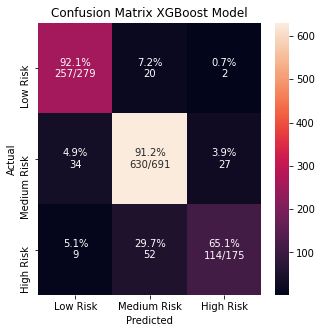

<Figure size 504x576 with 0 Axes>

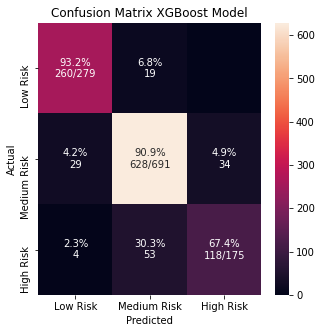

<Figure size 504x576 with 0 Axes>

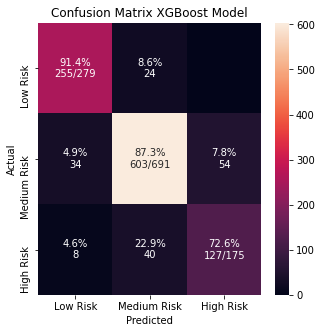

<Figure size 504x576 with 0 Axes>

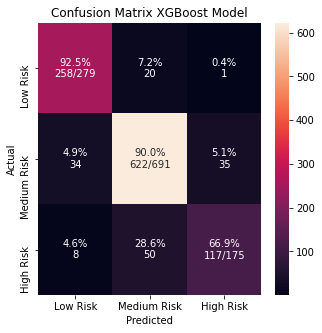

<Figure size 504x576 with 0 Axes>

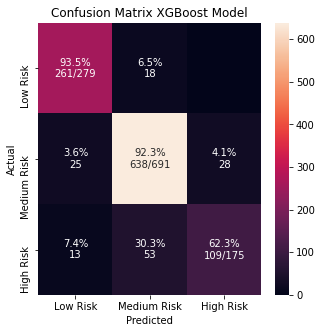

<Figure size 504x576 with 0 Axes>

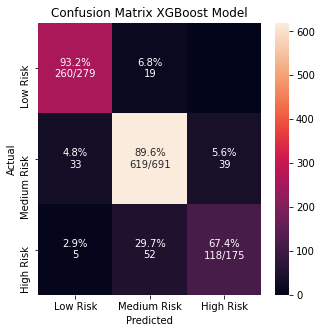

<Figure size 504x576 with 0 Axes>

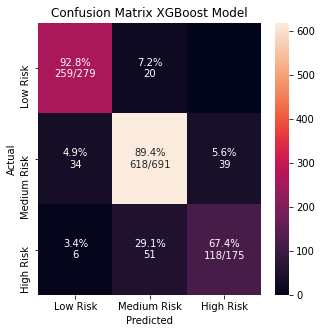

<Figure size 504x576 with 0 Axes>

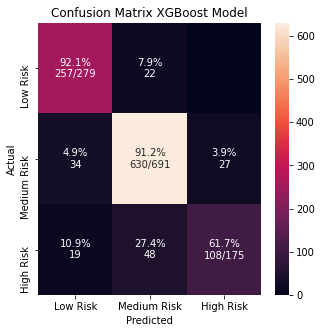

<Figure size 504x576 with 0 Axes>

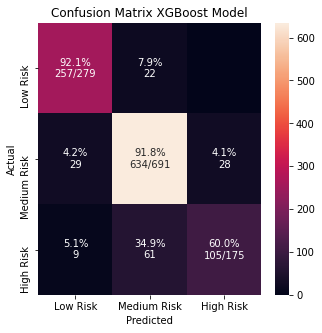

<Figure size 504x576 with 0 Axes>

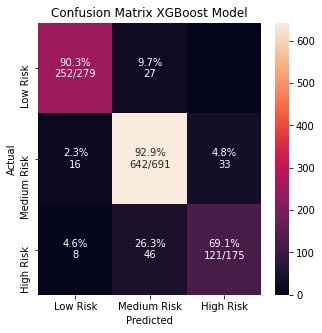

<Figure size 504x576 with 0 Axes>

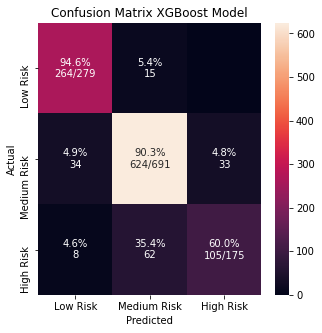

<Figure size 504x576 with 0 Axes>

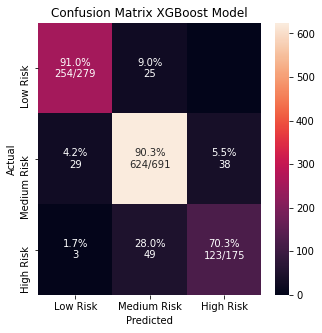

<Figure size 504x576 with 0 Axes>

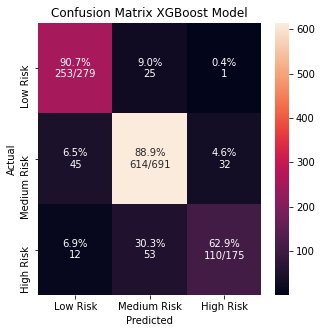

<Figure size 504x576 with 0 Axes>

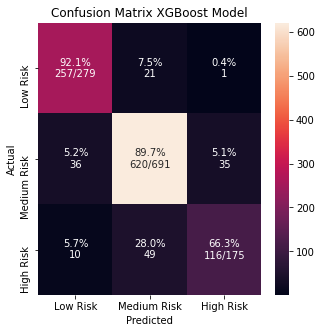

<Figure size 504x576 with 0 Axes>

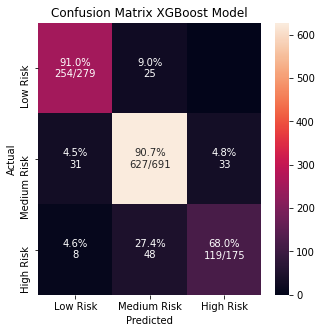

<Figure size 504x576 with 0 Axes>

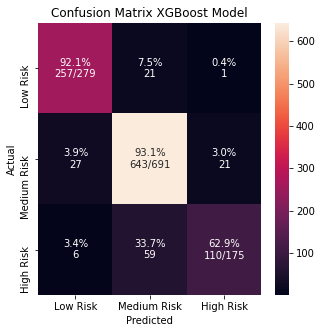

<Figure size 504x576 with 0 Axes>

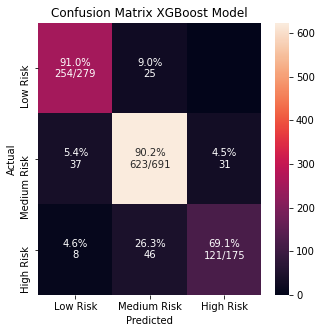

<Figure size 504x576 with 0 Axes>

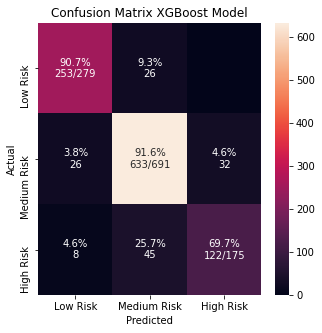

<Figure size 504x576 with 0 Axes>

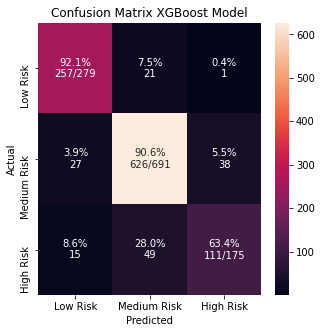

<Figure size 504x576 with 0 Axes>

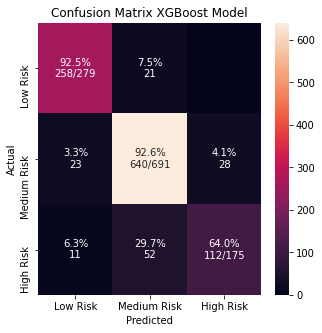

<Figure size 504x576 with 0 Axes>

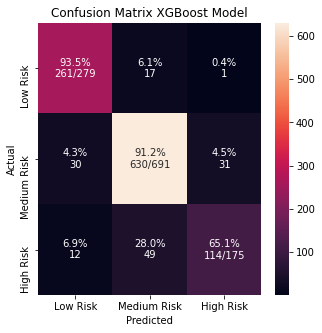

<Figure size 504x576 with 0 Axes>

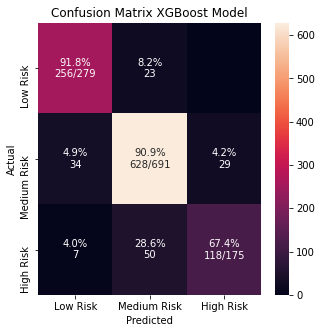

<Figure size 504x576 with 0 Axes>

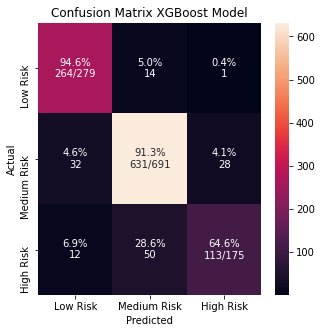

<Figure size 504x576 with 0 Axes>

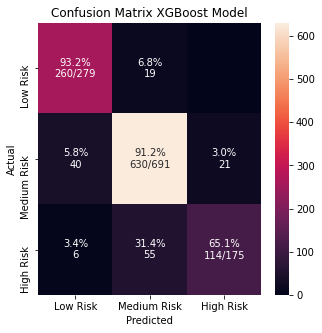

<Figure size 504x576 with 0 Axes>

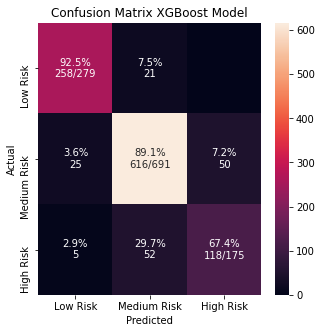

<Figure size 504x576 with 0 Axes>

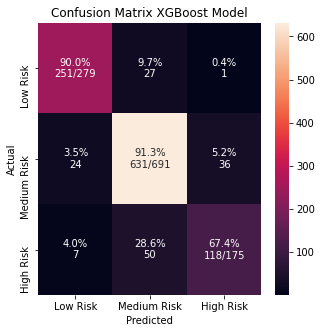

<Figure size 504x576 with 0 Axes>

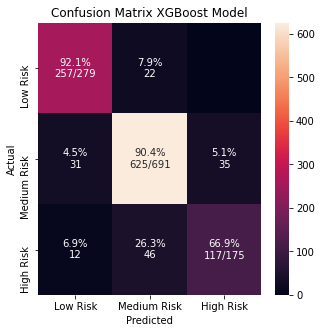

<Figure size 504x576 with 0 Axes>

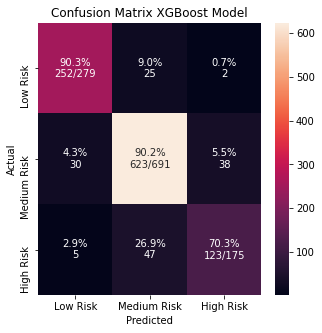

<Figure size 504x576 with 0 Axes>

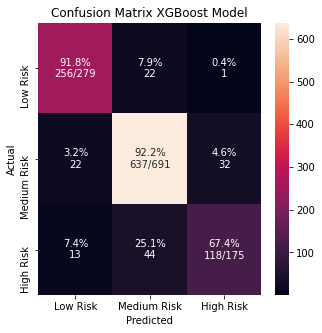

<Figure size 504x576 with 0 Axes>

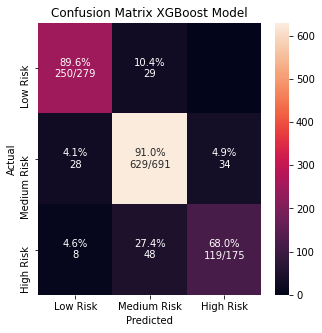

<Figure size 504x576 with 0 Axes>

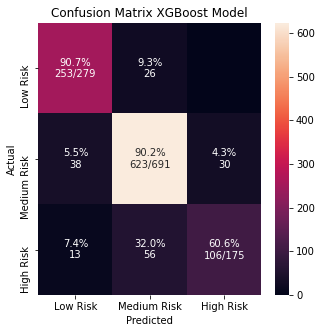

<Figure size 504x576 with 0 Axes>

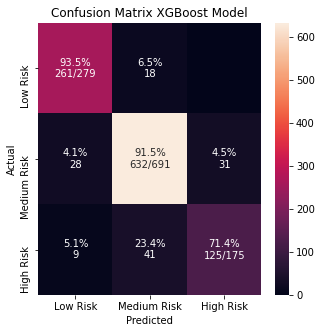

<Figure size 504x576 with 0 Axes>

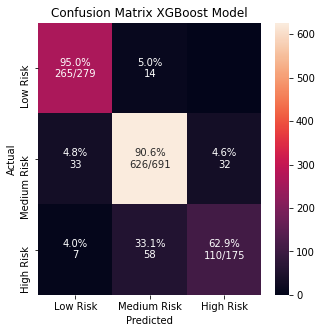

<Figure size 504x576 with 0 Axes>

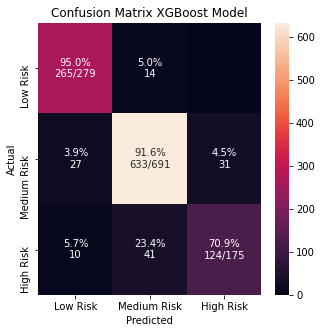

<Figure size 504x576 with 0 Axes>

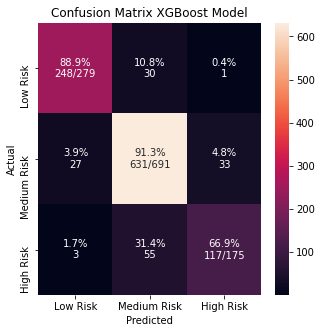

<Figure size 504x576 with 0 Axes>

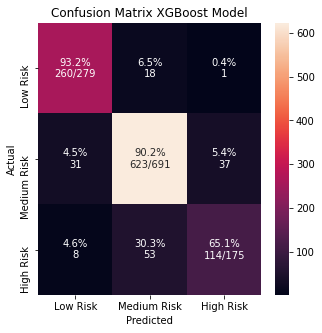

<Figure size 504x576 with 0 Axes>

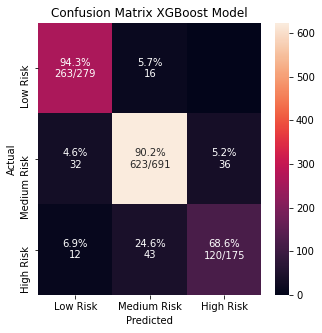

<Figure size 504x576 with 0 Axes>

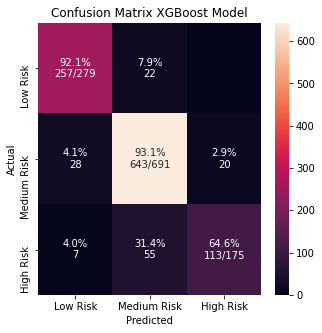

<Figure size 504x576 with 0 Axes>

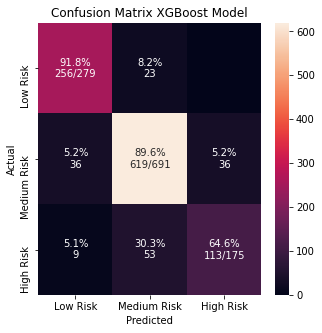

<Figure size 504x576 with 0 Axes>

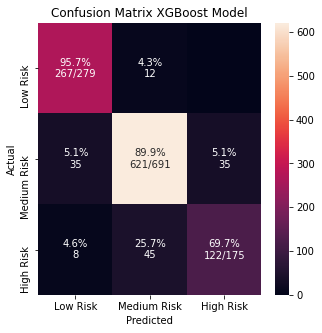

<Figure size 504x576 with 0 Axes>

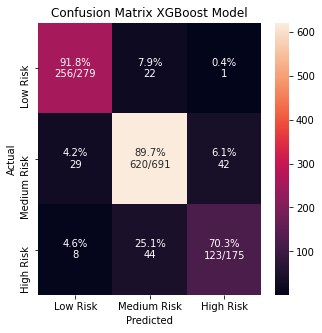

<Figure size 504x576 with 0 Axes>

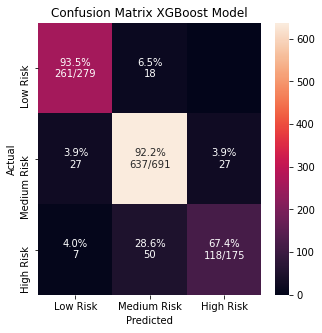

<Figure size 504x576 with 0 Axes>

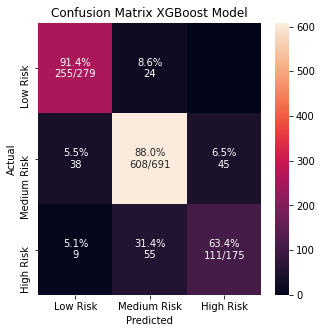

<Figure size 504x576 with 0 Axes>

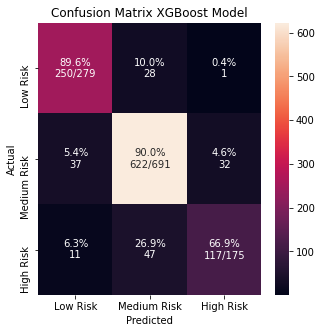

<Figure size 504x576 with 0 Axes>

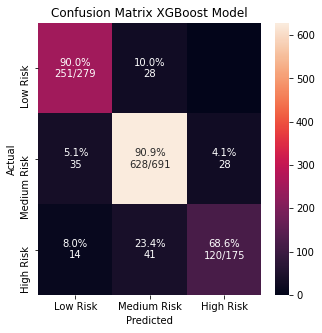

<Figure size 504x576 with 0 Axes>

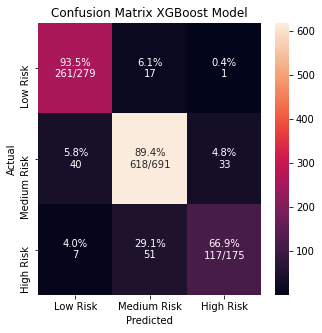

<Figure size 504x576 with 0 Axes>

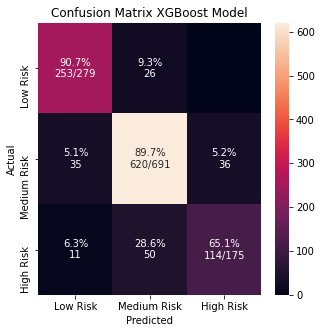

<Figure size 504x576 with 0 Axes>

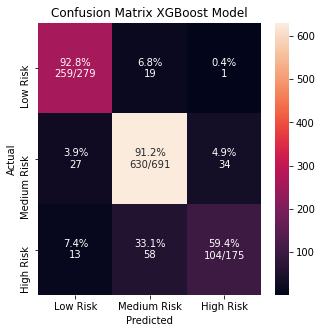

<Figure size 504x576 with 0 Axes>

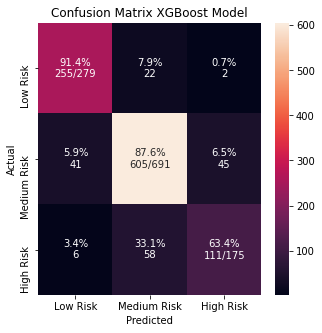

<Figure size 504x576 with 0 Axes>

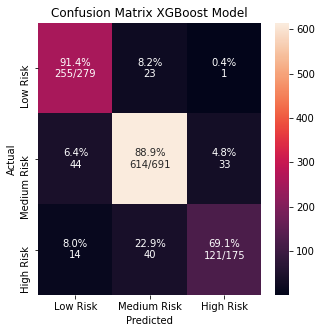

<Figure size 504x576 with 0 Axes>

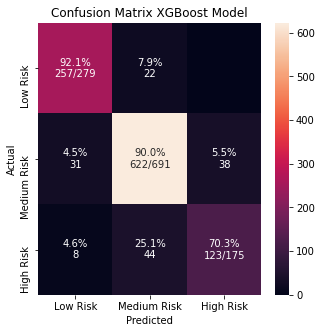

<Figure size 504x576 with 0 Axes>

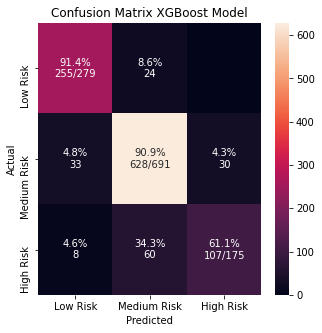

<Figure size 504x576 with 0 Axes>

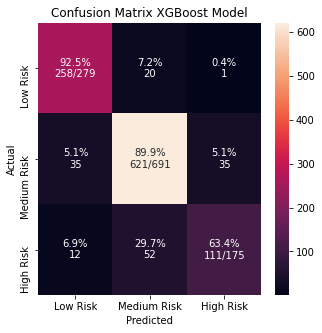

<Figure size 504x576 with 0 Axes>

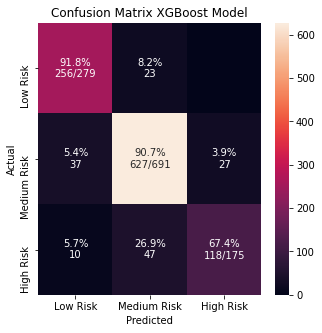

<Figure size 504x576 with 0 Axes>

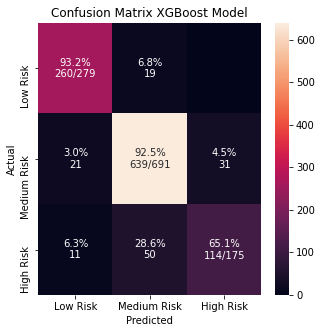

<Figure size 504x576 with 0 Axes>

interval_accuracy_start 0.8371712556387365
interval_accuracy_end 0.8776759059333161
mean accuracy 0.8574235807860263
interval_recall_start 0.8599465088744375
interval_recall_end 0.8977478142696674
avg_recall 0.8788471615720524
interval_precision_start 0.7939716198698881
interval_precision_end 0.8388227845311997
avg_precision 0.8163972022005439
interval_f1_start 0.8621016123896132
interval_f1n_end 0.8996297175774686
avg_f1 0.8808656649835409
interval_AUC_start 0.8634483681312956
interval_AUC_end 0.9008041018273029
avg_auc 0.8821262349792992


In [622]:

list_accuracy_score=[]
list_recall_score=[]
list_precision_score=[]
list_f1_score=[]
list_AUC=[]
for i in range(100):
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, train_size=0.8,test_size=0.2 , stratify=y)
    output,n,precision,recall,f1,AUC=applying_ML(X_train, Y_train, X_test, Y_test, 'XGBoost', 'XGBoost',depth=None, Cvalue=1,alphaValue=0.0)
    list_accuracy_score.append(output)
    list_recall_score.append(recall)
    list_precision_score.append(precision)
    list_f1_score.append(f1)
    list_AUC.append(AUC)
avg_accuracy = (mean(list_accuracy_score))
avg_recall = (mean(list_recall_score))
avg_precision = (mean(list_precision_score))
avg_f1=(mean(list_f1_score))
avg_AUC=(mean(list_AUC))

interval_accuracy_end=avg_accuracy + 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_accuracy_start=avg_accuracy - 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_recall_end=avg_recall + 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_recall_start=avg_recall - 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_precision_end=avg_precision + 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_precision_start=avg_precision - 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_f1_end=avg_f1 + 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)
interval_f1_start=avg_f1 - 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)

interval_AUC_end=avg_AUC + 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)
interval_AUC_start=avg_AUC - 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)

print("interval_accuracy_start", interval_accuracy_start)
print("interval_accuracy_end",interval_accuracy_end)
print("mean accuracy",avg_accuracy)


print("interval_recall_start", interval_recall_start)
print("interval_recall_end",interval_recall_end)
print("avg_recall",avg_recall)


print("interval_precision_start", interval_precision_start)
print("interval_precision_end",interval_precision_end)
print("avg_precision",avg_precision)


print("interval_f1_start", interval_f1_start)
print("interval_f1n_end",interval_f1_end)
print("avg_f1",avg_f1)

print("interval_AUC_start", interval_AUC_start)
print("interval_AUC_end",interval_AUC_end)
print("avg_auc",avg_AUC)

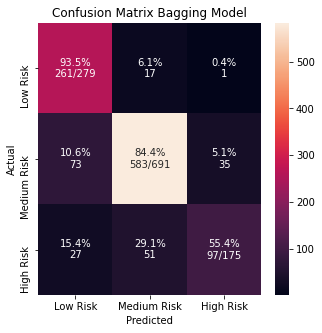

<Figure size 504x576 with 0 Axes>

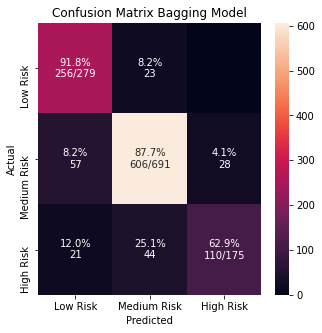

<Figure size 504x576 with 0 Axes>

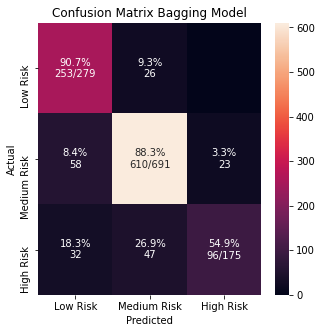

<Figure size 504x576 with 0 Axes>

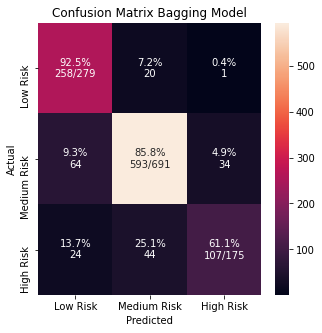

<Figure size 504x576 with 0 Axes>

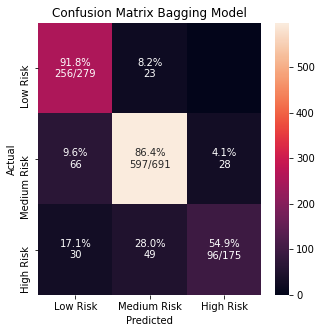

<Figure size 504x576 with 0 Axes>

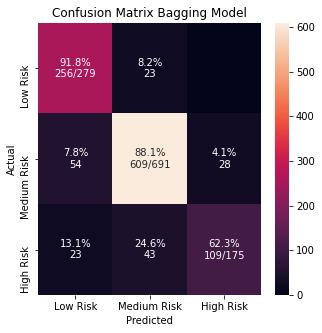

<Figure size 504x576 with 0 Axes>

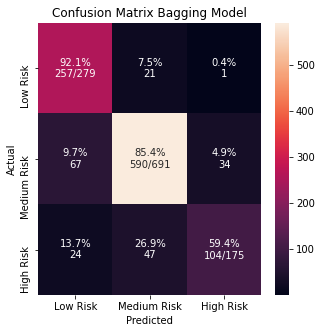

<Figure size 504x576 with 0 Axes>

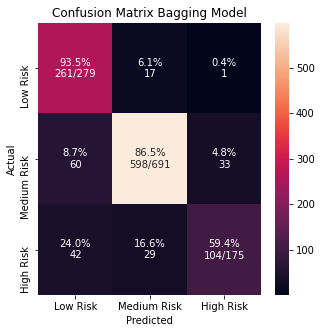

<Figure size 504x576 with 0 Axes>

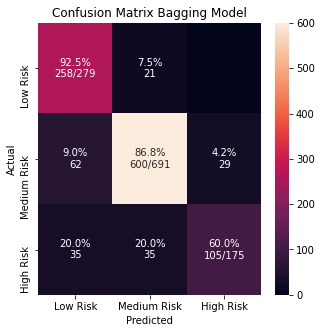

<Figure size 504x576 with 0 Axes>

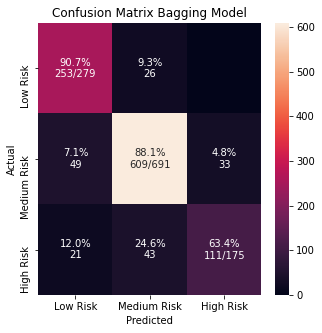

<Figure size 504x576 with 0 Axes>

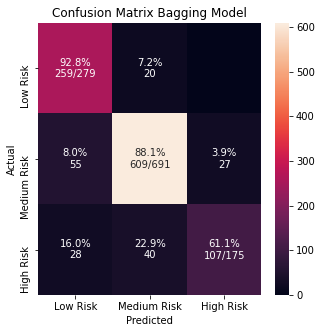

<Figure size 504x576 with 0 Axes>

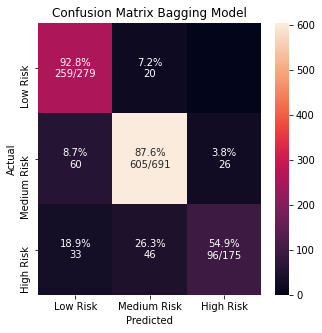

<Figure size 504x576 with 0 Axes>

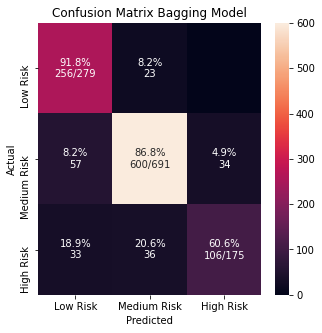

<Figure size 504x576 with 0 Axes>

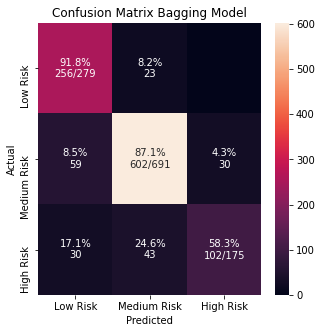

<Figure size 504x576 with 0 Axes>

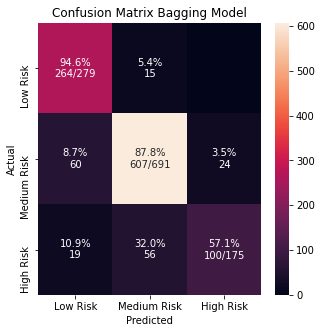

<Figure size 504x576 with 0 Axes>

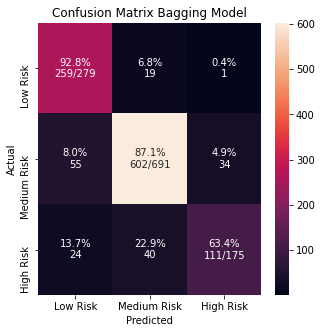

<Figure size 504x576 with 0 Axes>

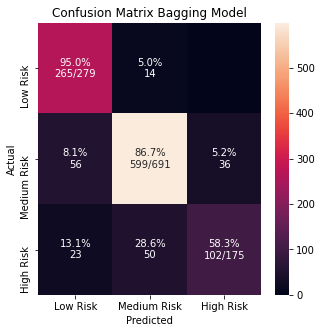

<Figure size 504x576 with 0 Axes>

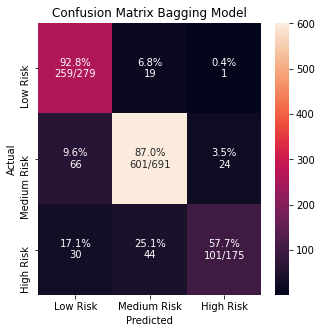

<Figure size 504x576 with 0 Axes>

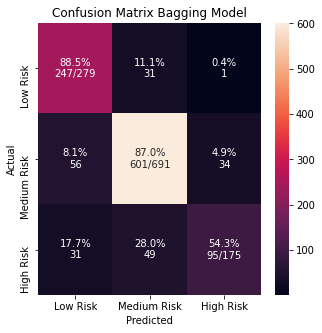

<Figure size 504x576 with 0 Axes>

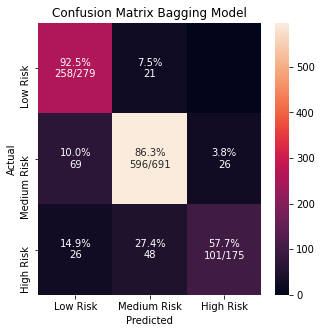

<Figure size 504x576 with 0 Axes>

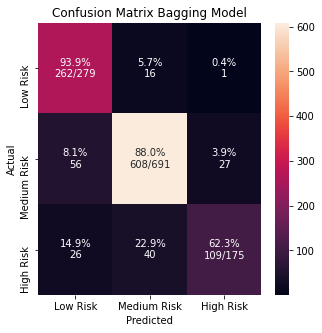

<Figure size 504x576 with 0 Axes>

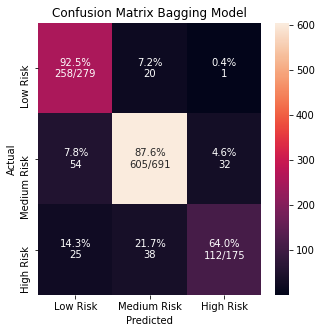

<Figure size 504x576 with 0 Axes>

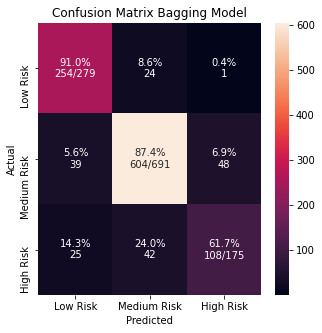

<Figure size 504x576 with 0 Axes>

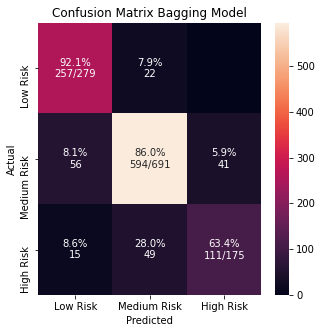

<Figure size 504x576 with 0 Axes>

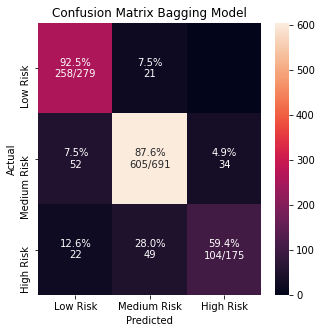

<Figure size 504x576 with 0 Axes>

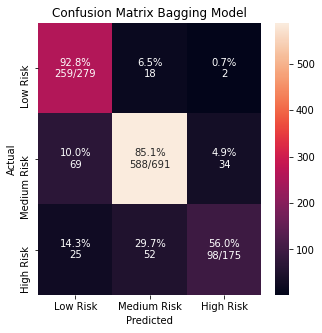

<Figure size 504x576 with 0 Axes>

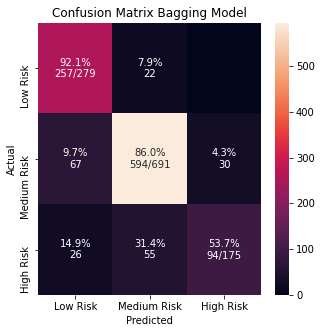

<Figure size 504x576 with 0 Axes>

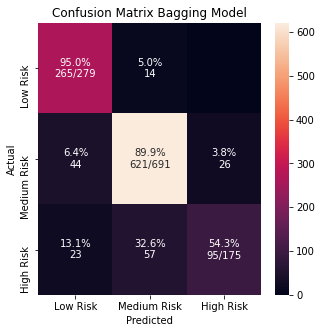

<Figure size 504x576 with 0 Axes>

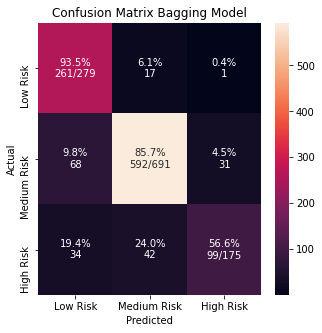

<Figure size 504x576 with 0 Axes>

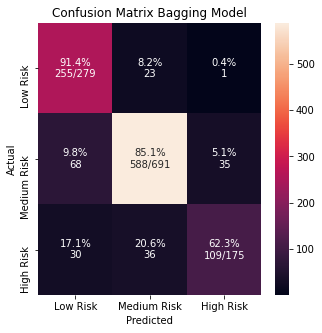

<Figure size 504x576 with 0 Axes>

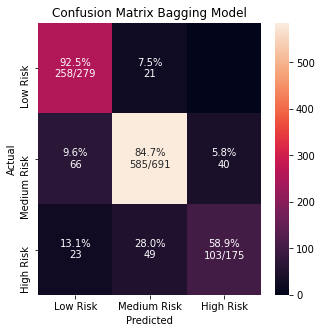

<Figure size 504x576 with 0 Axes>

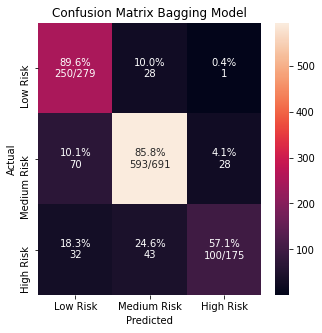

<Figure size 504x576 with 0 Axes>

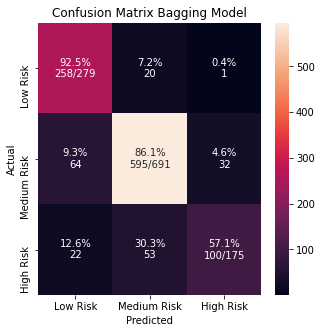

<Figure size 504x576 with 0 Axes>

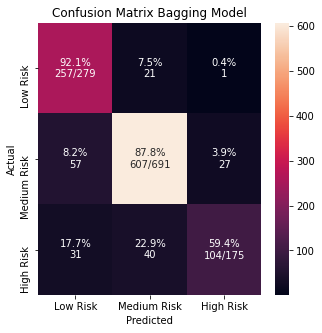

<Figure size 504x576 with 0 Axes>

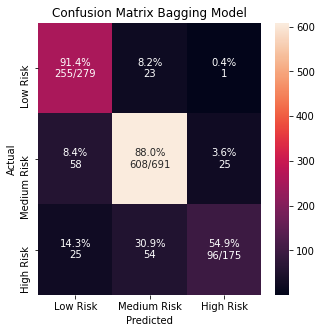

<Figure size 504x576 with 0 Axes>

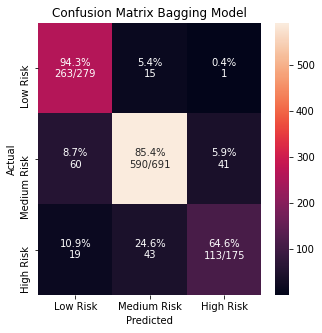

<Figure size 504x576 with 0 Axes>

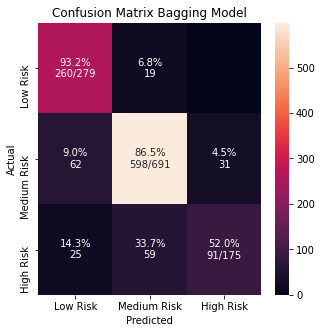

<Figure size 504x576 with 0 Axes>

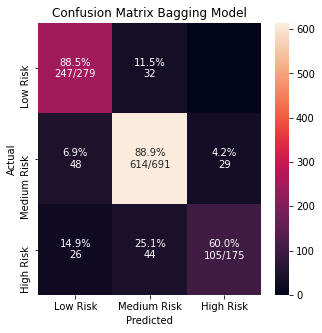

<Figure size 504x576 with 0 Axes>

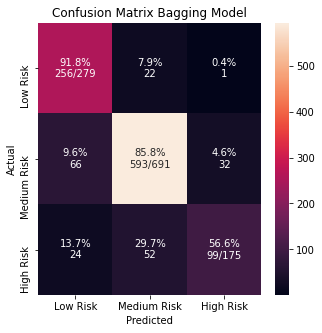

<Figure size 504x576 with 0 Axes>

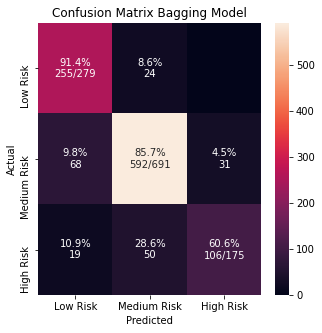

<Figure size 504x576 with 0 Axes>

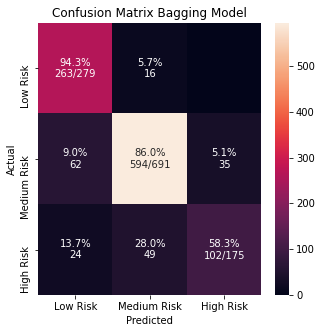

<Figure size 504x576 with 0 Axes>

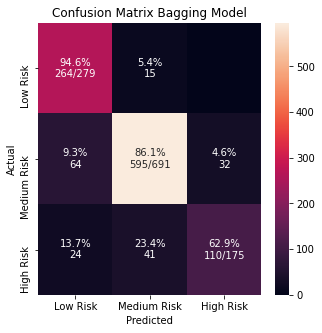

<Figure size 504x576 with 0 Axes>

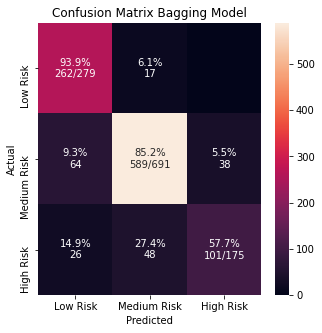

<Figure size 504x576 with 0 Axes>

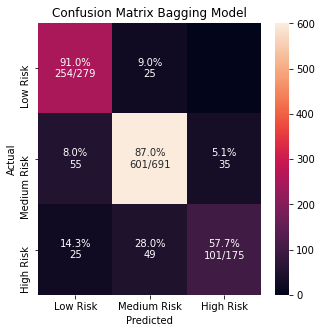

<Figure size 504x576 with 0 Axes>

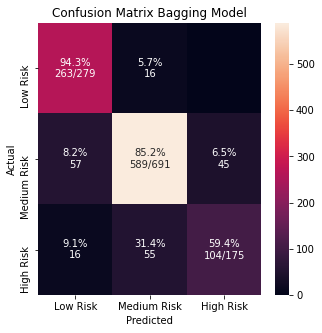

<Figure size 504x576 with 0 Axes>

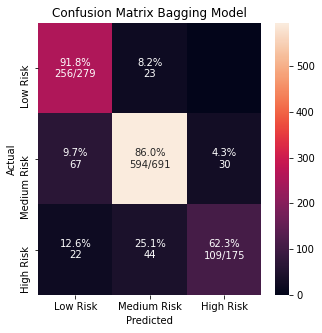

<Figure size 504x576 with 0 Axes>

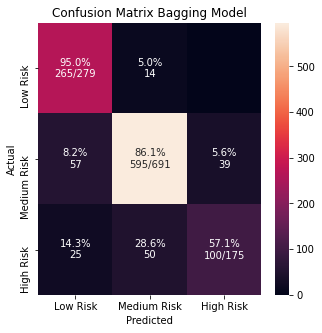

<Figure size 504x576 with 0 Axes>

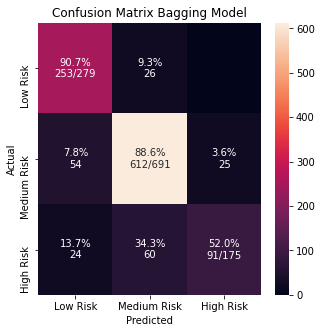

<Figure size 504x576 with 0 Axes>

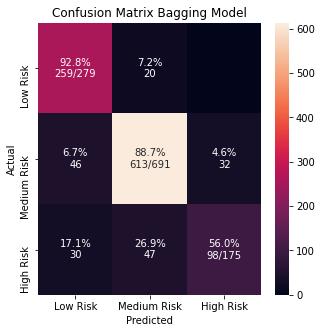

<Figure size 504x576 with 0 Axes>

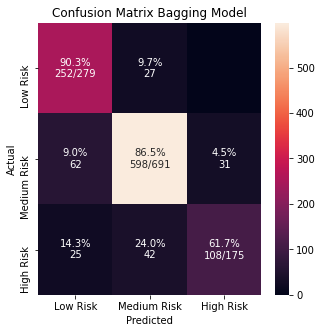

<Figure size 504x576 with 0 Axes>

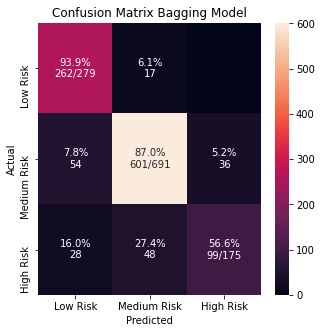

<Figure size 504x576 with 0 Axes>

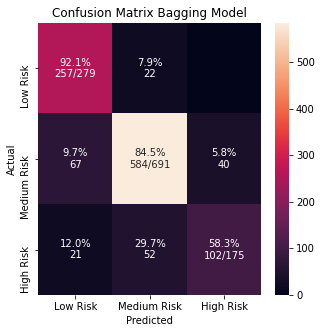

<Figure size 504x576 with 0 Axes>

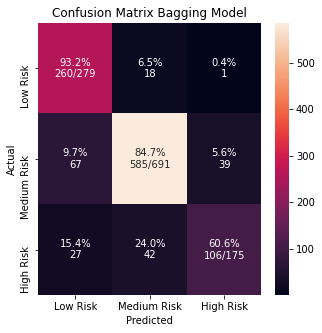

<Figure size 504x576 with 0 Axes>

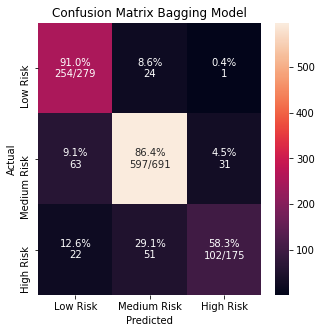

<Figure size 504x576 with 0 Axes>

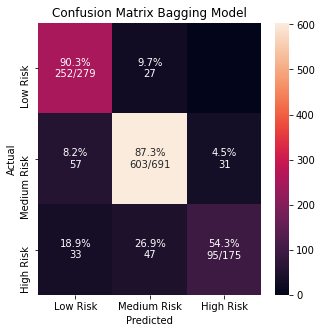

<Figure size 504x576 with 0 Axes>

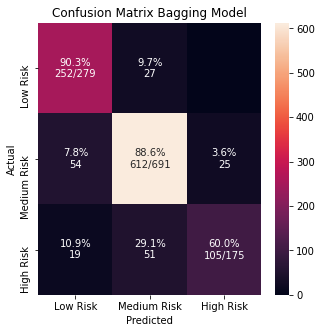

<Figure size 504x576 with 0 Axes>

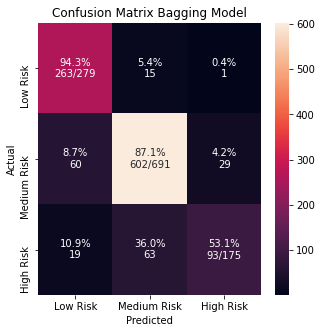

<Figure size 504x576 with 0 Axes>

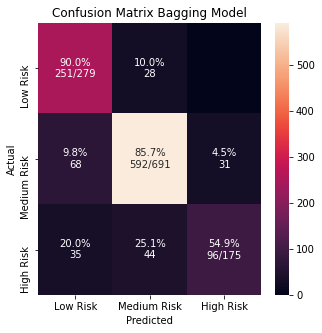

<Figure size 504x576 with 0 Axes>

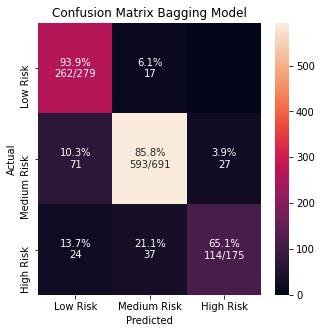

<Figure size 504x576 with 0 Axes>

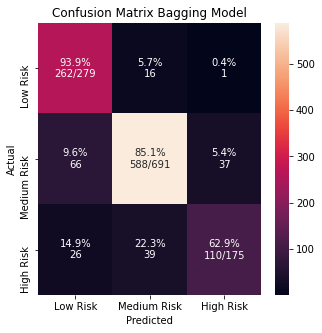

<Figure size 504x576 with 0 Axes>

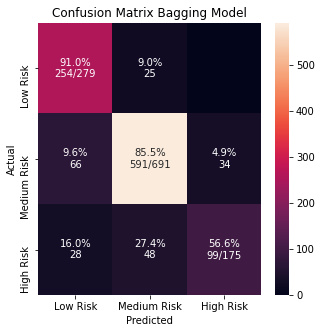

<Figure size 504x576 with 0 Axes>

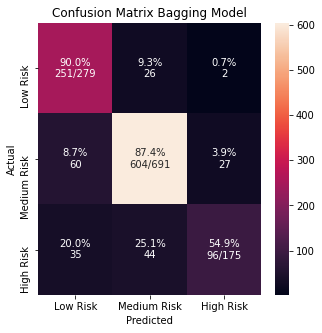

<Figure size 504x576 with 0 Axes>

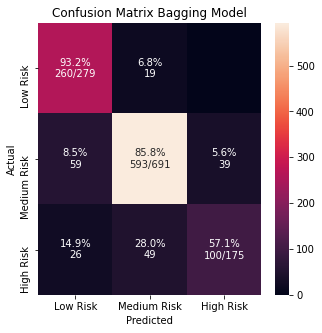

<Figure size 504x576 with 0 Axes>

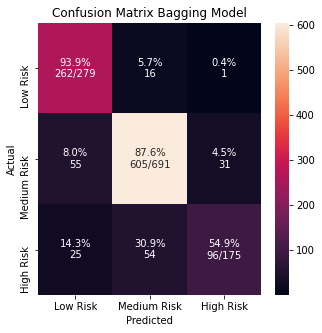

<Figure size 504x576 with 0 Axes>

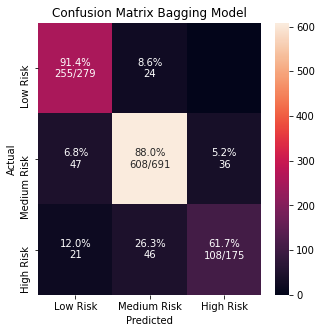

<Figure size 504x576 with 0 Axes>

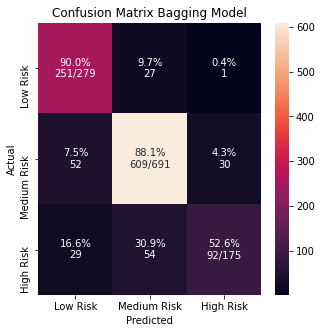

<Figure size 504x576 with 0 Axes>

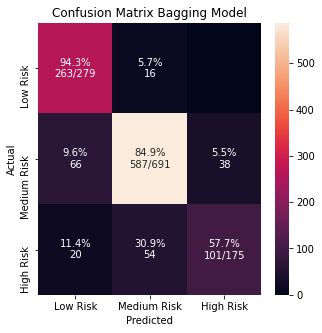

<Figure size 504x576 with 0 Axes>

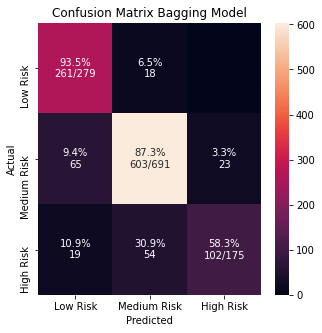

<Figure size 504x576 with 0 Axes>

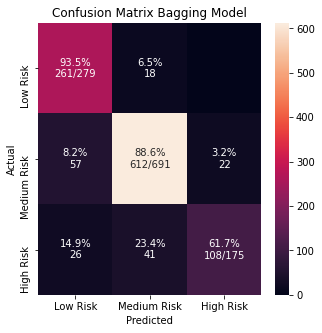

<Figure size 504x576 with 0 Axes>

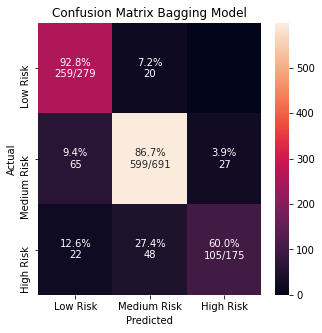

<Figure size 504x576 with 0 Axes>

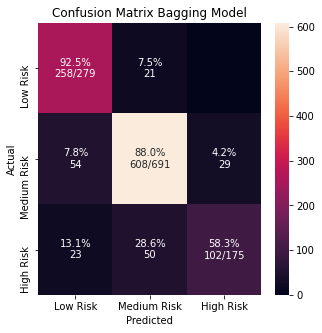

<Figure size 504x576 with 0 Axes>

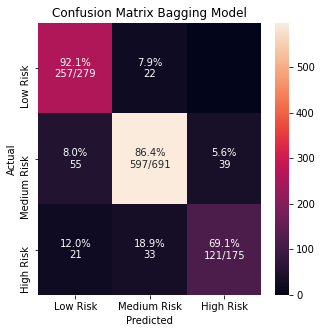

<Figure size 504x576 with 0 Axes>

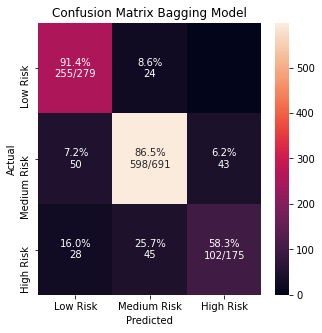

<Figure size 504x576 with 0 Axes>

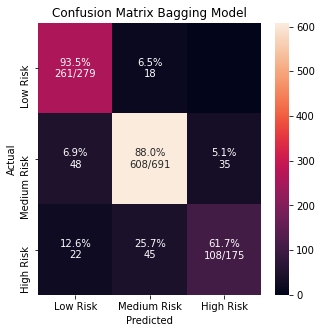

<Figure size 504x576 with 0 Axes>

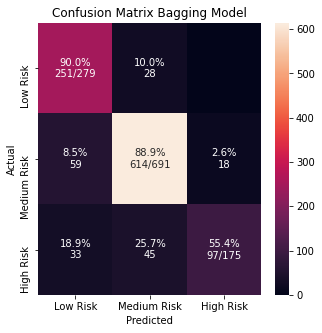

<Figure size 504x576 with 0 Axes>

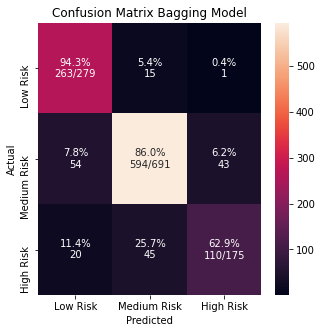

<Figure size 504x576 with 0 Axes>

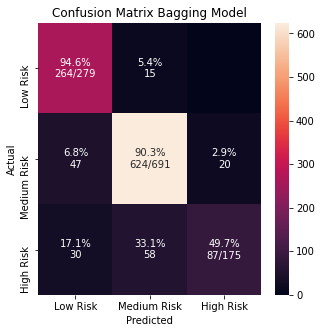

<Figure size 504x576 with 0 Axes>

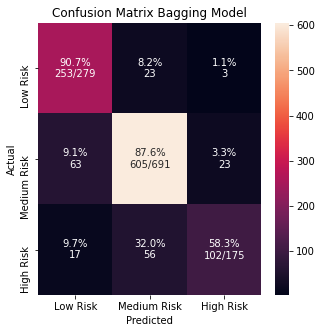

<Figure size 504x576 with 0 Axes>

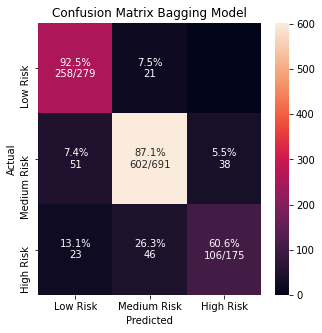

<Figure size 504x576 with 0 Axes>

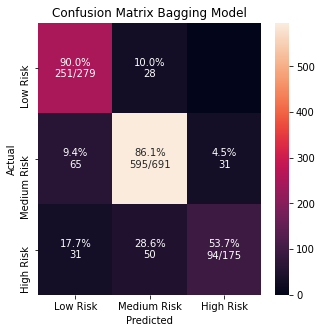

<Figure size 504x576 with 0 Axes>

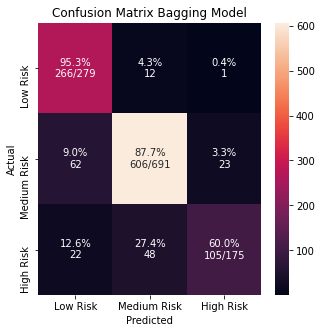

<Figure size 504x576 with 0 Axes>

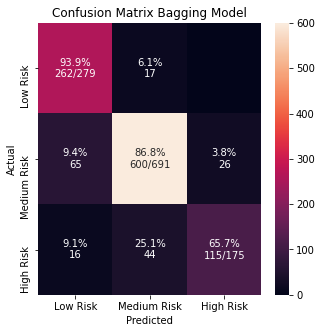

<Figure size 504x576 with 0 Axes>

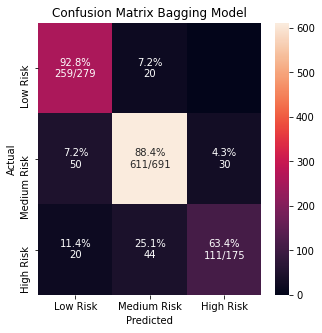

<Figure size 504x576 with 0 Axes>

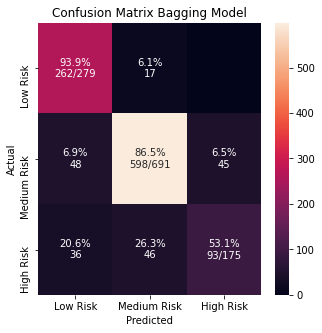

<Figure size 504x576 with 0 Axes>

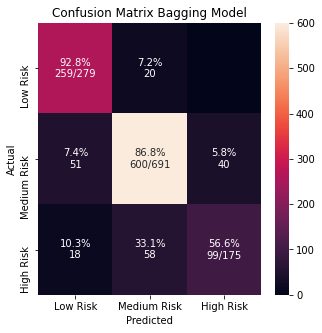

<Figure size 504x576 with 0 Axes>

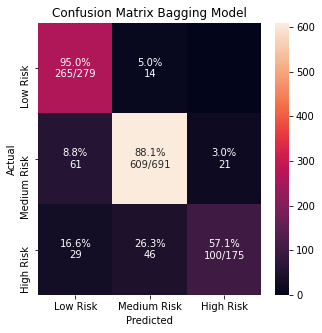

<Figure size 504x576 with 0 Axes>

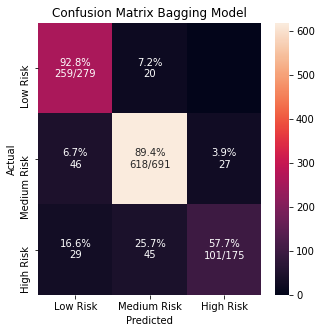

<Figure size 504x576 with 0 Axes>

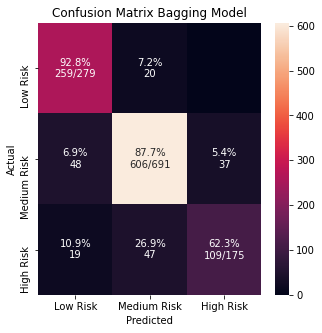

<Figure size 504x576 with 0 Axes>

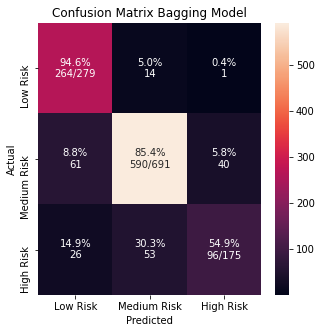

<Figure size 504x576 with 0 Axes>

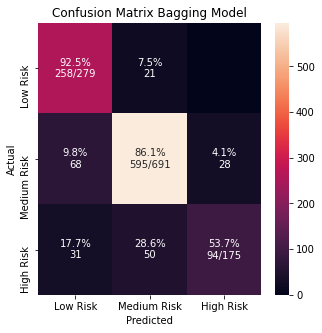

<Figure size 504x576 with 0 Axes>

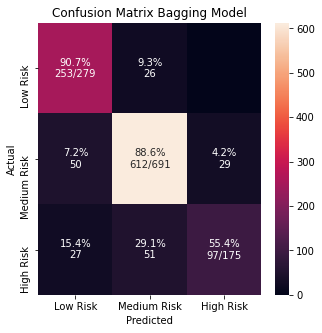

<Figure size 504x576 with 0 Axes>

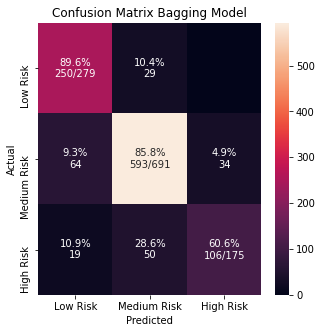

<Figure size 504x576 with 0 Axes>

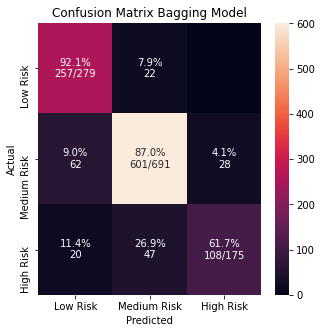

<Figure size 504x576 with 0 Axes>

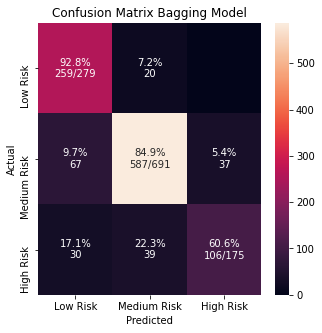

<Figure size 504x576 with 0 Axes>

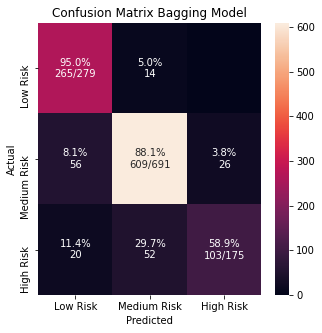

<Figure size 504x576 with 0 Axes>

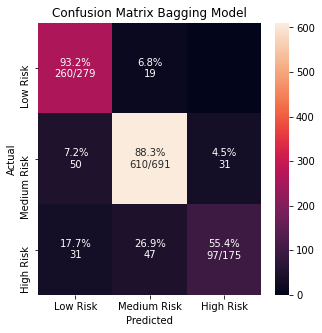

<Figure size 504x576 with 0 Axes>

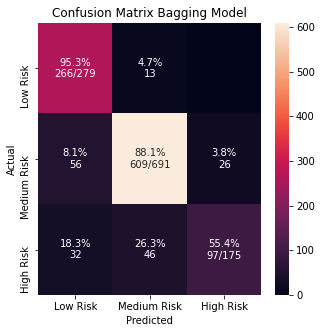

<Figure size 504x576 with 0 Axes>

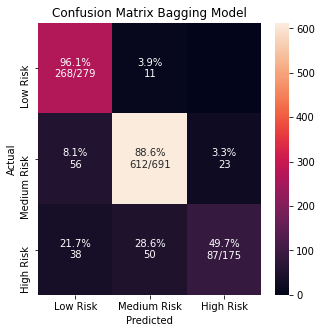

<Figure size 504x576 with 0 Axes>

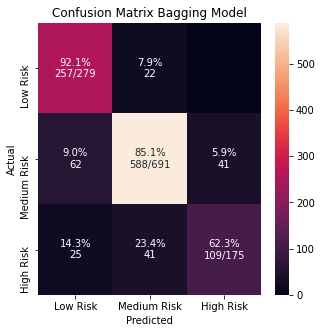

<Figure size 504x576 with 0 Axes>

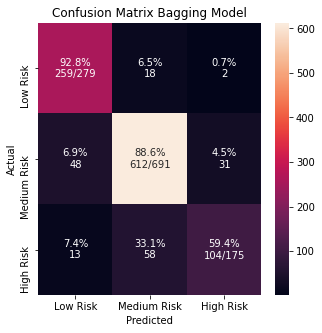

<Figure size 504x576 with 0 Axes>

interval_accuracy_start 0.7952663036925058
interval_accuracy_end 0.8400000718533456
mean accuracy 0.8176331877729257
interval_recall_start 0.8206612187133752
interval_recall_end 0.8629370345617341
avg_recall 0.8417991266375546
interval_precision_start 0.7699220221756574
interval_precision_end 0.8168265291774902
avg_precision 0.7933742756765738
interval_f1_start 0.840260937486152
interval_f1n_end 0.8804174030566012
avg_f1 0.8603391702713766
interval_AUC_start 0.8424519155512887
interval_AUC_end 0.8823581058012938
avg_auc 0.8624050106762913


In [623]:

list_accuracy_score=[]
list_recall_score=[]
list_precision_score=[]
list_f1_score=[]
list_AUC=[]
for i in range(100):
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, train_size=0.8,test_size=0.2 , stratify=y)
    output,n,precision,recall,f1,AUC=applying_ML(X_train, Y_train, X_test, Y_test, 'Bagging', 'Bagging',depth=None, Cvalue=1,alphaValue=0.0)
    list_accuracy_score.append(output)
    list_recall_score.append(recall)
    list_precision_score.append(precision)
    list_f1_score.append(f1)
    list_AUC.append(AUC)
avg_accuracy = (mean(list_accuracy_score))
avg_recall = (mean(list_recall_score))
avg_precision = (mean(list_precision_score))
avg_f1=(mean(list_f1_score))
avg_AUC=(mean(list_AUC))

interval_accuracy_end=avg_accuracy + 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_accuracy_start=avg_accuracy - 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_recall_end=avg_recall + 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_recall_start=avg_recall - 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_precision_end=avg_precision + 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_precision_start=avg_precision - 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_f1_end=avg_f1 + 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)
interval_f1_start=avg_f1 - 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)

interval_AUC_end=avg_AUC + 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)
interval_AUC_start=avg_AUC - 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)

print("interval_accuracy_start", interval_accuracy_start)
print("interval_accuracy_end",interval_accuracy_end)
print("mean accuracy",avg_accuracy)


print("interval_recall_start", interval_recall_start)
print("interval_recall_end",interval_recall_end)
print("avg_recall",avg_recall)


print("interval_precision_start", interval_precision_start)
print("interval_precision_end",interval_precision_end)
print("avg_precision",avg_precision)


print("interval_f1_start", interval_f1_start)
print("interval_f1n_end",interval_f1_end)
print("avg_f1",avg_f1)

print("interval_AUC_start", interval_AUC_start)
print("interval_AUC_end",interval_AUC_end)
print("avg_auc",avg_AUC)

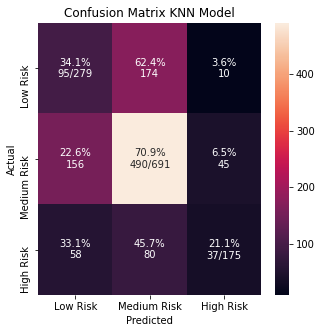

<Figure size 504x576 with 0 Axes>

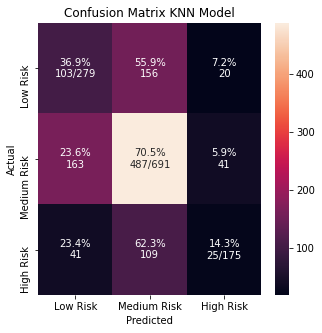

<Figure size 504x576 with 0 Axes>

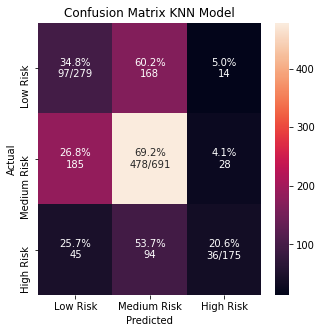

<Figure size 504x576 with 0 Axes>

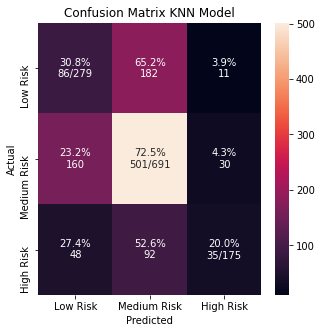

<Figure size 504x576 with 0 Axes>

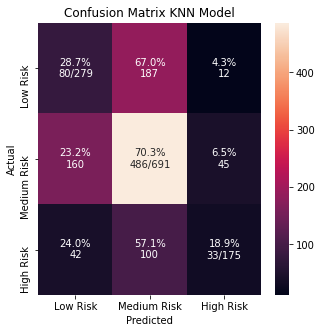

<Figure size 504x576 with 0 Axes>

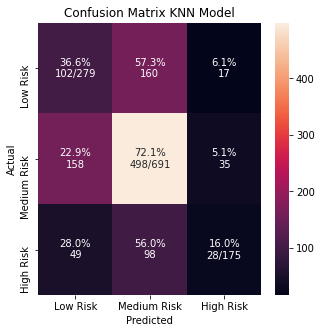

<Figure size 504x576 with 0 Axes>

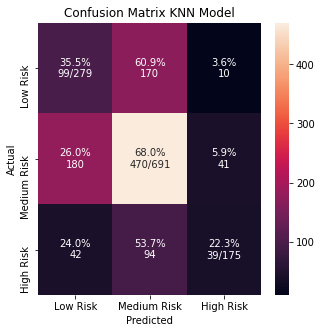

<Figure size 504x576 with 0 Axes>

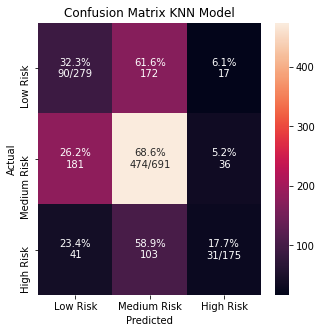

<Figure size 504x576 with 0 Axes>

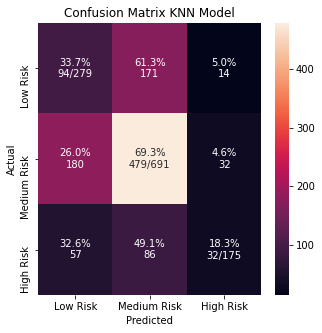

<Figure size 504x576 with 0 Axes>

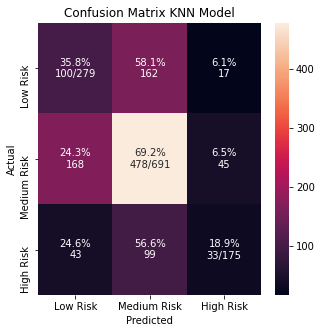

<Figure size 504x576 with 0 Axes>

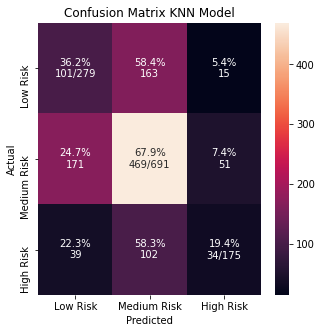

<Figure size 504x576 with 0 Axes>

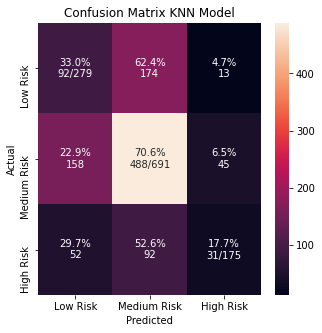

<Figure size 504x576 with 0 Axes>

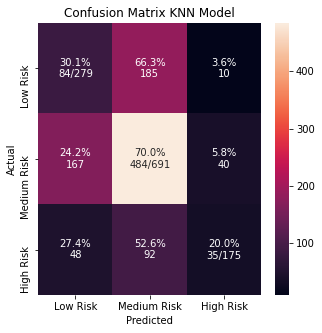

<Figure size 504x576 with 0 Axes>

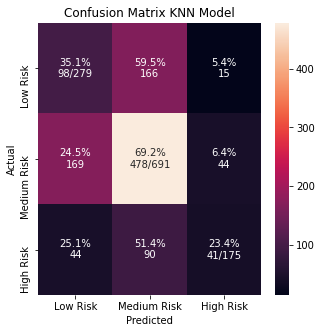

<Figure size 504x576 with 0 Axes>

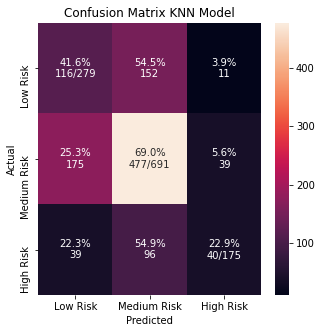

<Figure size 504x576 with 0 Axes>

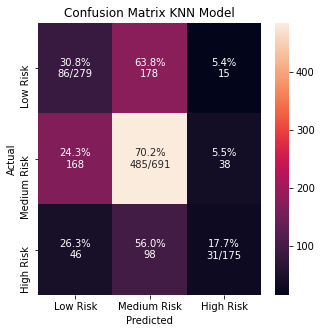

<Figure size 504x576 with 0 Axes>

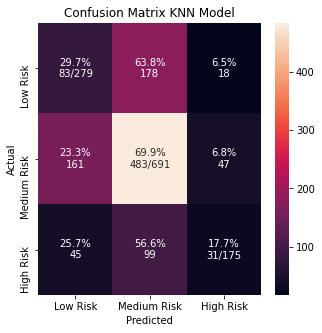

<Figure size 504x576 with 0 Axes>

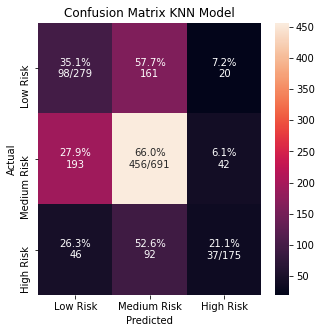

<Figure size 504x576 with 0 Axes>

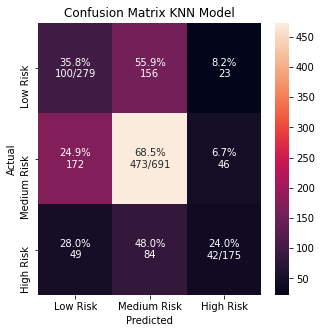

<Figure size 504x576 with 0 Axes>

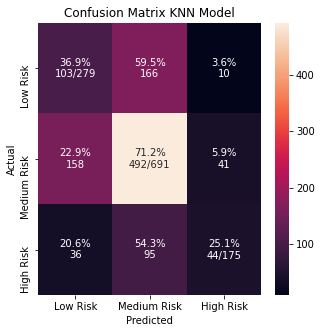

<Figure size 504x576 with 0 Axes>

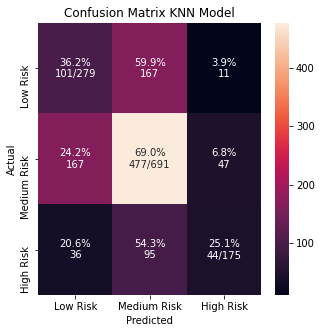

<Figure size 504x576 with 0 Axes>

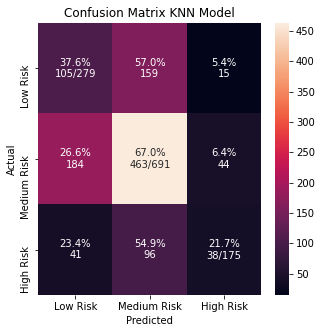

<Figure size 504x576 with 0 Axes>

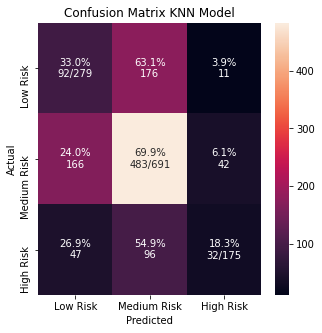

<Figure size 504x576 with 0 Axes>

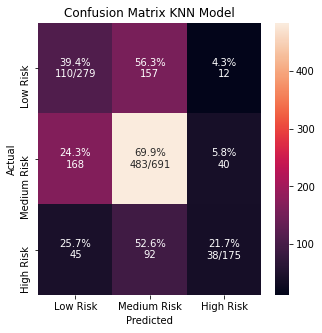

<Figure size 504x576 with 0 Axes>

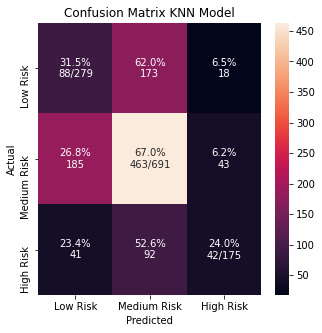

<Figure size 504x576 with 0 Axes>

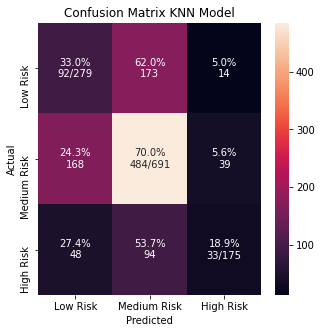

<Figure size 504x576 with 0 Axes>

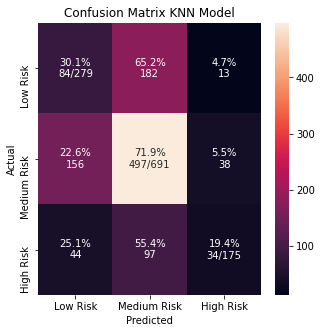

<Figure size 504x576 with 0 Axes>

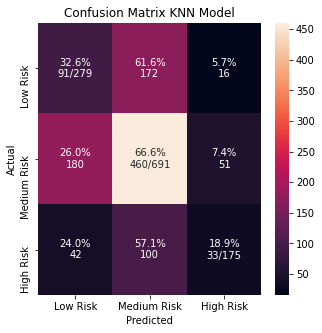

<Figure size 504x576 with 0 Axes>

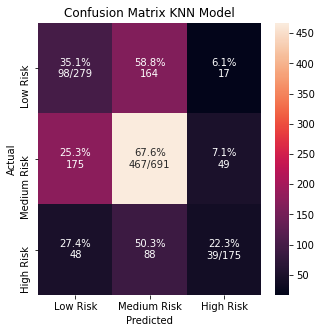

<Figure size 504x576 with 0 Axes>

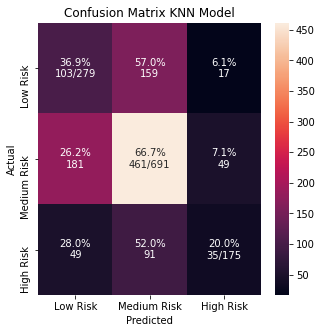

<Figure size 504x576 with 0 Axes>

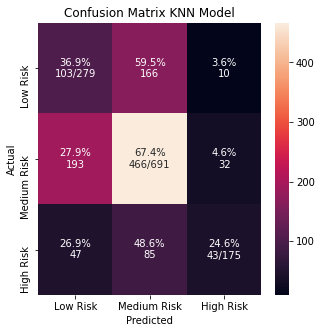

<Figure size 504x576 with 0 Axes>

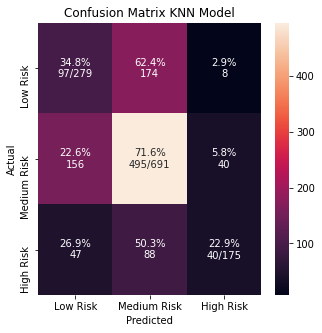

<Figure size 504x576 with 0 Axes>

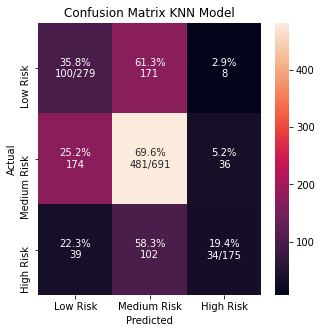

<Figure size 504x576 with 0 Axes>

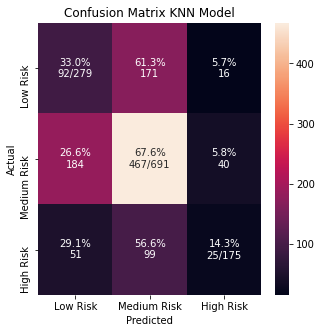

<Figure size 504x576 with 0 Axes>

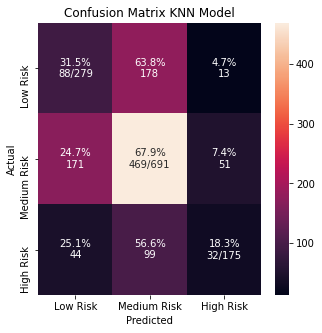

<Figure size 504x576 with 0 Axes>

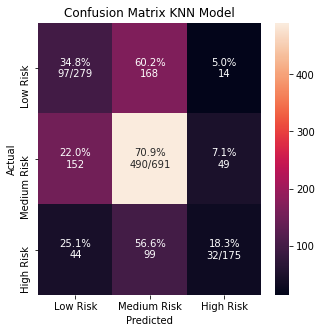

<Figure size 504x576 with 0 Axes>

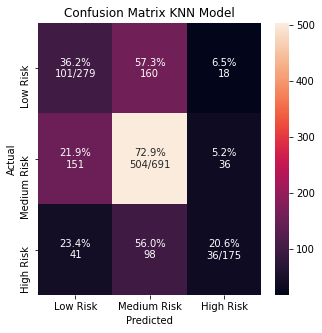

<Figure size 504x576 with 0 Axes>

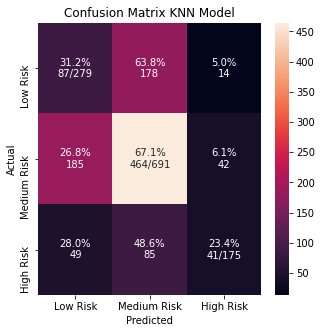

<Figure size 504x576 with 0 Axes>

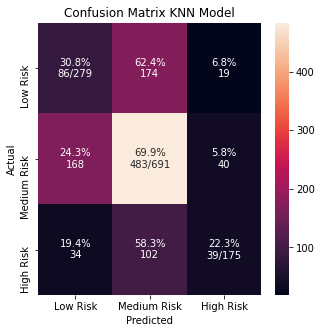

<Figure size 504x576 with 0 Axes>

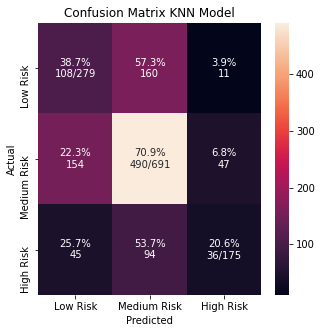

<Figure size 504x576 with 0 Axes>

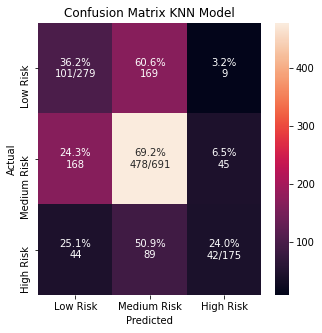

<Figure size 504x576 with 0 Axes>

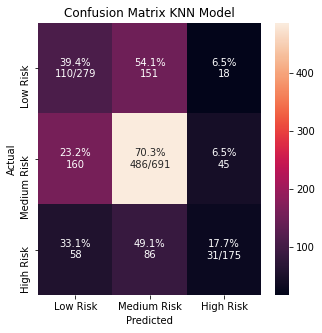

<Figure size 504x576 with 0 Axes>

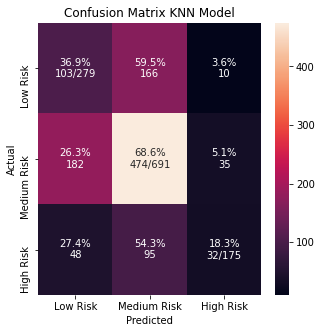

<Figure size 504x576 with 0 Axes>

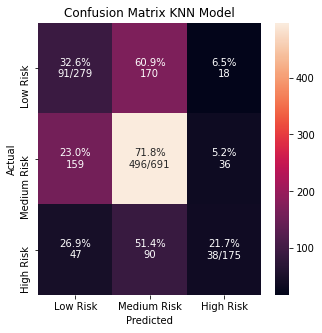

<Figure size 504x576 with 0 Axes>

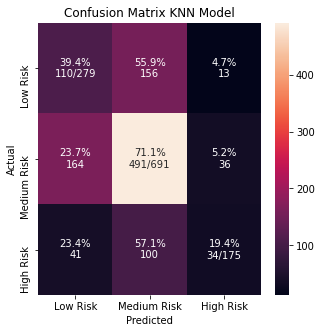

<Figure size 504x576 with 0 Axes>

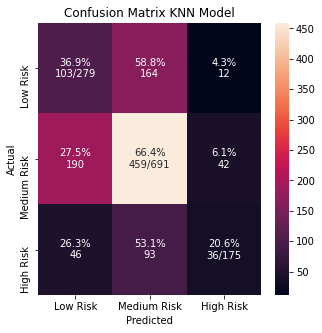

<Figure size 504x576 with 0 Axes>

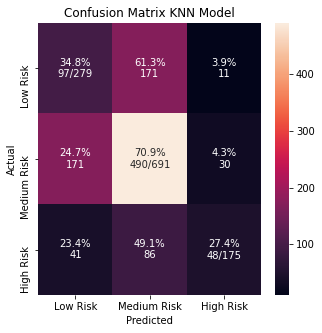

<Figure size 504x576 with 0 Axes>

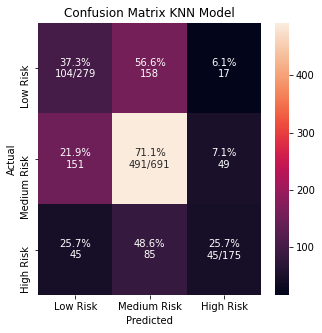

<Figure size 504x576 with 0 Axes>

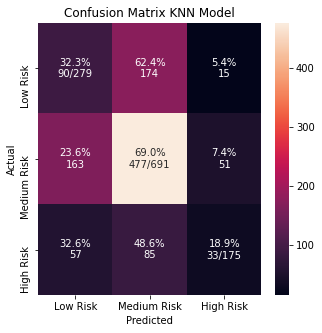

<Figure size 504x576 with 0 Axes>

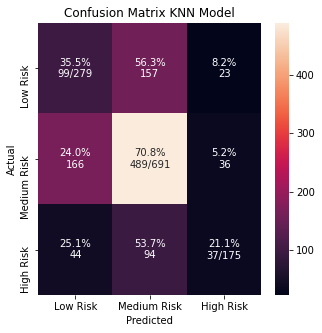

<Figure size 504x576 with 0 Axes>

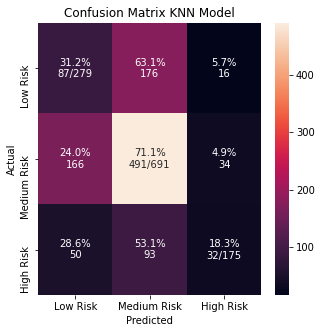

<Figure size 504x576 with 0 Axes>

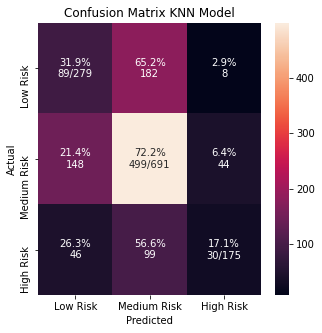

<Figure size 504x576 with 0 Axes>

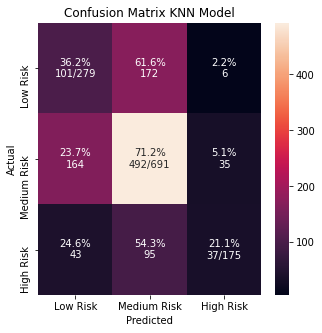

<Figure size 504x576 with 0 Axes>

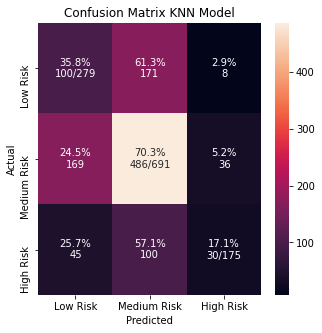

<Figure size 504x576 with 0 Axes>

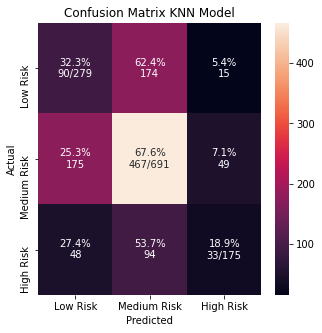

<Figure size 504x576 with 0 Axes>

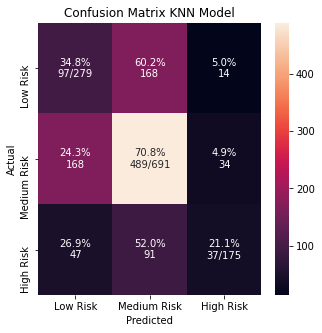

<Figure size 504x576 with 0 Axes>

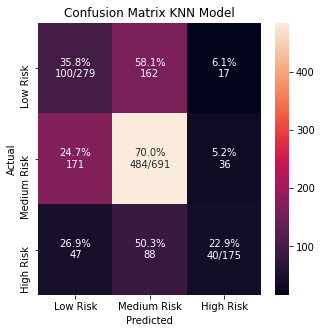

<Figure size 504x576 with 0 Axes>

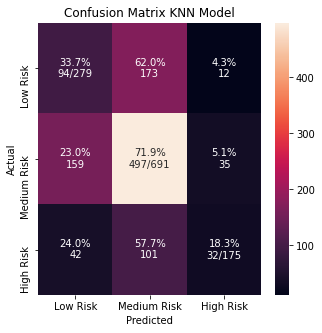

<Figure size 504x576 with 0 Axes>

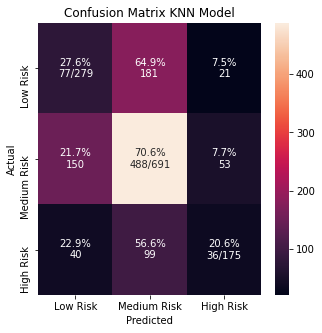

<Figure size 504x576 with 0 Axes>

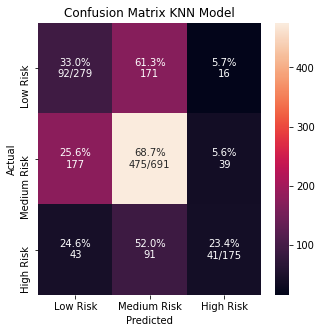

<Figure size 504x576 with 0 Axes>

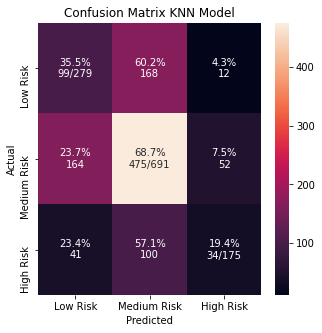

<Figure size 504x576 with 0 Axes>

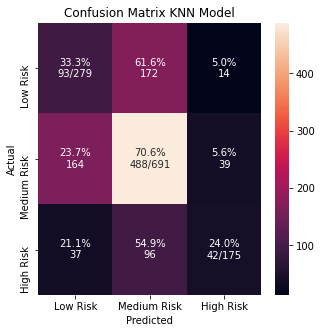

<Figure size 504x576 with 0 Axes>

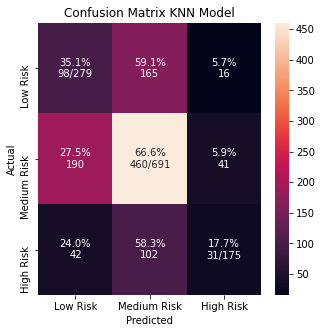

<Figure size 504x576 with 0 Axes>

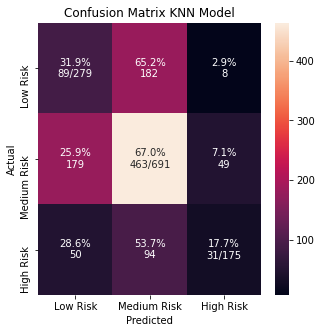

<Figure size 504x576 with 0 Axes>

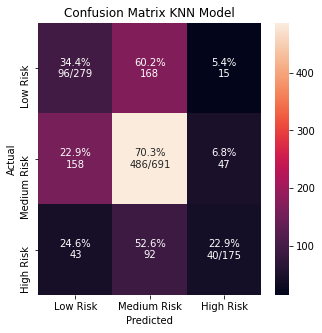

<Figure size 504x576 with 0 Axes>

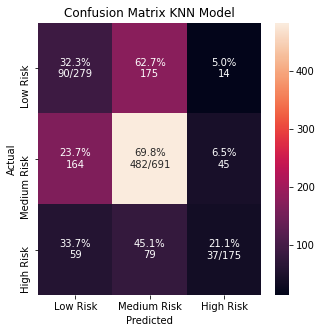

<Figure size 504x576 with 0 Axes>

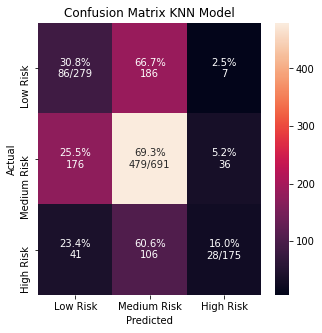

<Figure size 504x576 with 0 Axes>

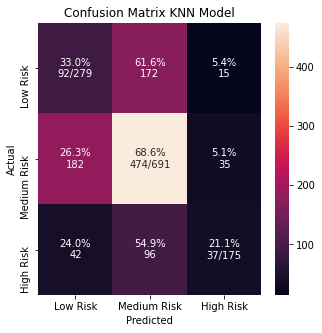

<Figure size 504x576 with 0 Axes>

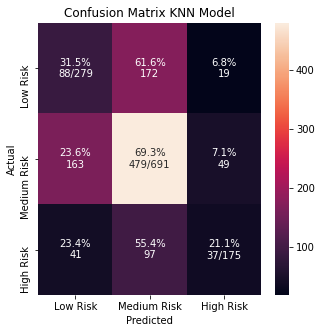

<Figure size 504x576 with 0 Axes>

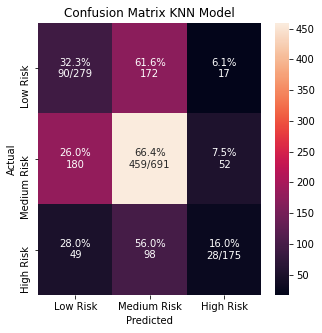

<Figure size 504x576 with 0 Axes>

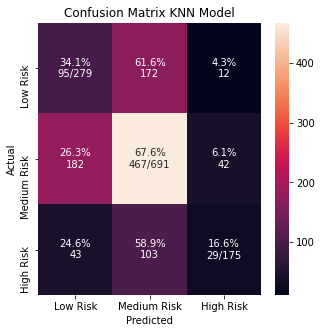

<Figure size 504x576 with 0 Axes>

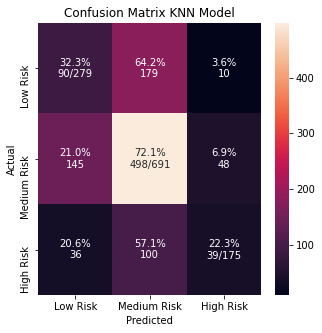

<Figure size 504x576 with 0 Axes>

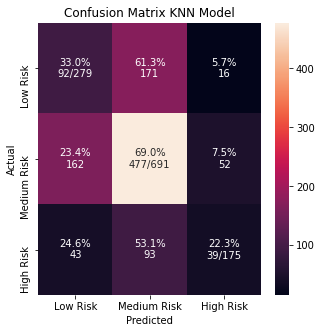

<Figure size 504x576 with 0 Axes>

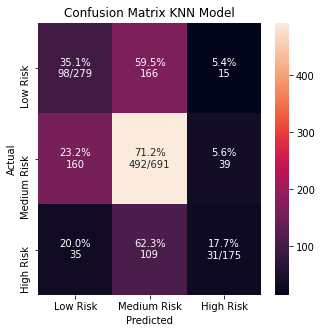

<Figure size 504x576 with 0 Axes>

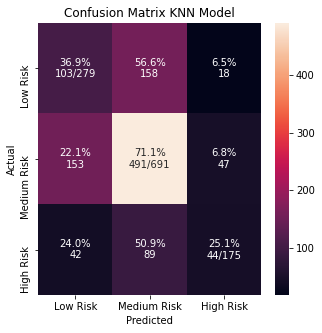

<Figure size 504x576 with 0 Axes>

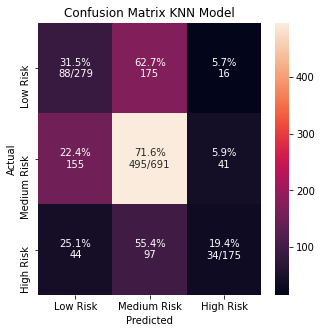

<Figure size 504x576 with 0 Axes>

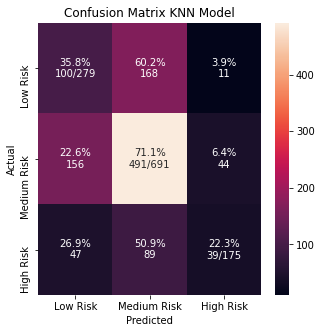

<Figure size 504x576 with 0 Axes>

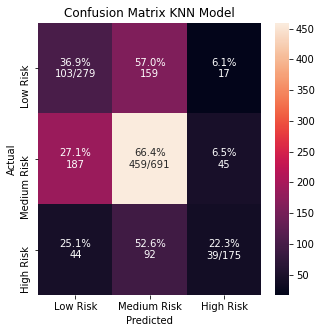

<Figure size 504x576 with 0 Axes>

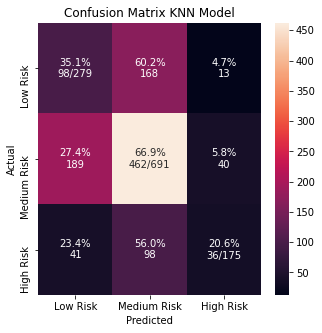

<Figure size 504x576 with 0 Axes>

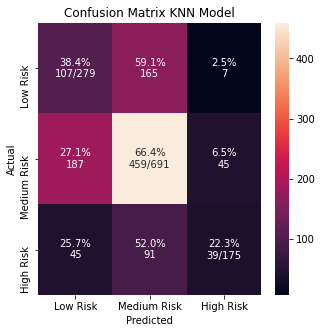

<Figure size 504x576 with 0 Axes>

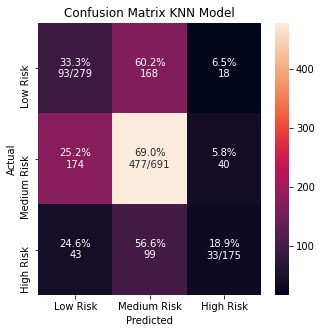

<Figure size 504x576 with 0 Axes>

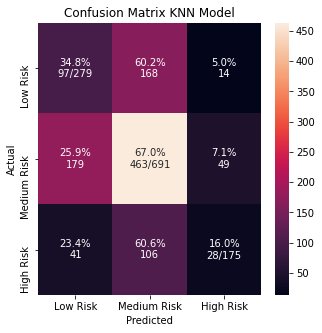

<Figure size 504x576 with 0 Axes>

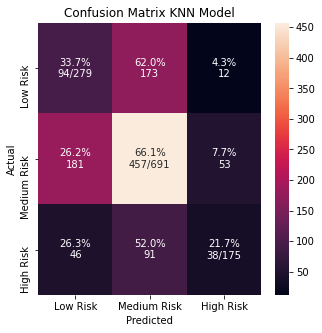

<Figure size 504x576 with 0 Axes>

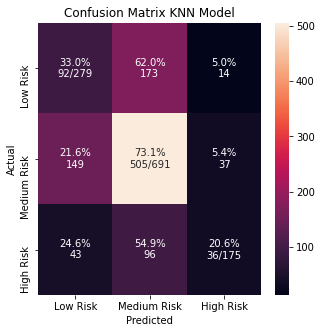

<Figure size 504x576 with 0 Axes>

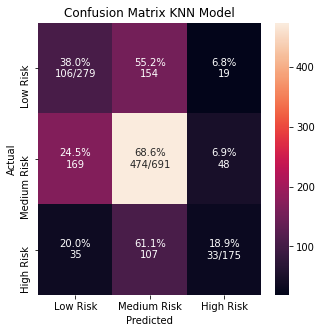

<Figure size 504x576 with 0 Axes>

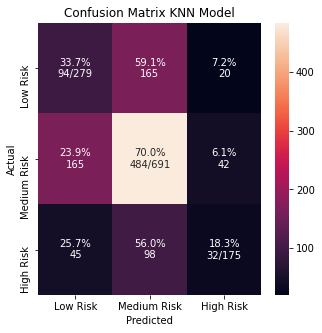

<Figure size 504x576 with 0 Axes>

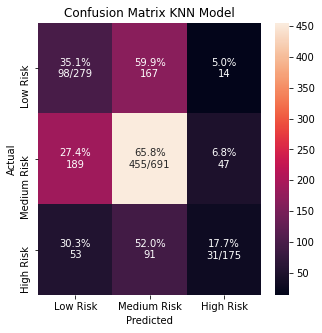

<Figure size 504x576 with 0 Axes>

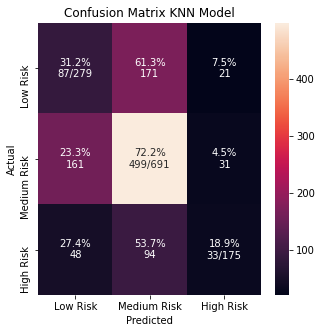

<Figure size 504x576 with 0 Axes>

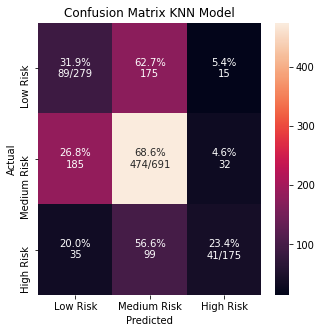

<Figure size 504x576 with 0 Axes>

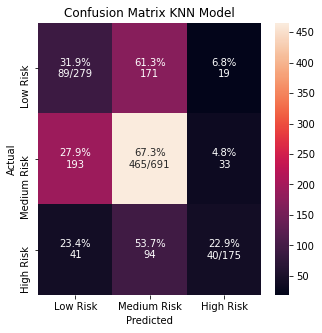

<Figure size 504x576 with 0 Axes>

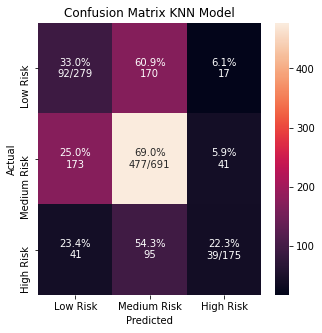

<Figure size 504x576 with 0 Axes>

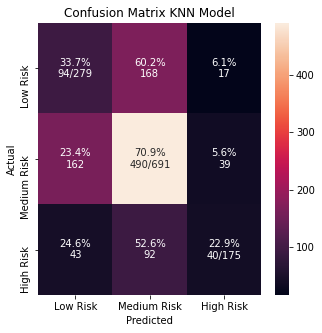

<Figure size 504x576 with 0 Axes>

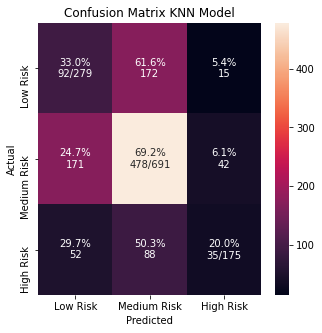

<Figure size 504x576 with 0 Axes>

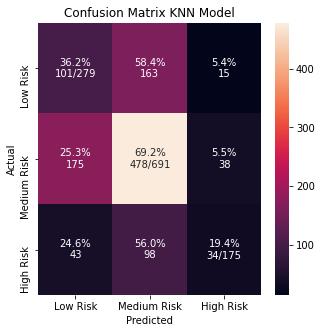

<Figure size 504x576 with 0 Axes>

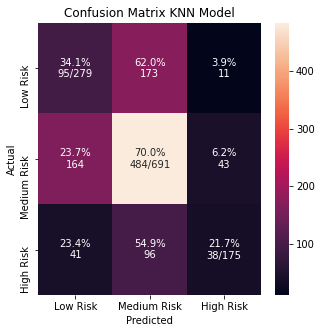

<Figure size 504x576 with 0 Axes>

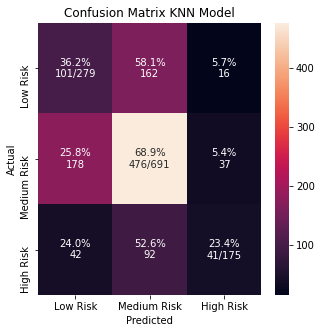

<Figure size 504x576 with 0 Axes>

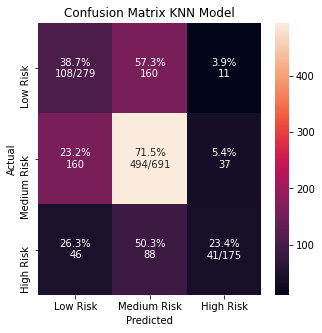

<Figure size 504x576 with 0 Axes>

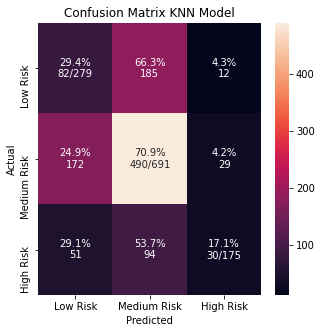

<Figure size 504x576 with 0 Axes>

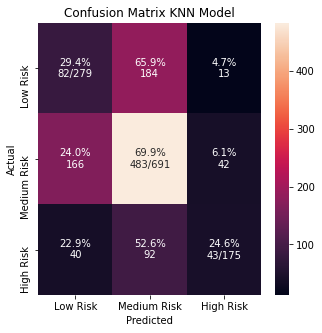

<Figure size 504x576 with 0 Axes>

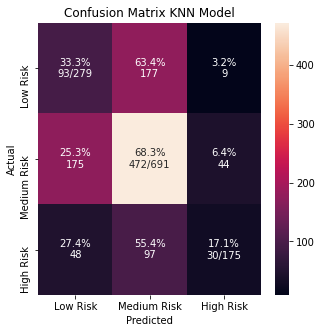

<Figure size 504x576 with 0 Axes>

interval_accuracy_start 0.4702174262365688
interval_accuracy_end 0.5281406523660512
mean accuracy 0.49917903930131
interval_recall_start 0.4702174262365688
interval_recall_end 0.5281406523660512
avg_recall 0.49917903930131
interval_precision_start 0.42994819621776537
interval_precision_end 0.48767463214464934
avg_precision 0.45881141418120736
interval_f1_start 0.5095560060955298
interval_f1n_end 0.5673079494249682
avg_f1 0.538431977760249
interval_AUC_start 0.5312752898197016
interval_AUC_end 0.5887796492177003
avg_auc 0.560027469518701


In [624]:

list_accuracy_score=[]
list_recall_score=[]
list_precision_score=[]
list_f1_score=[]
list_AUC=[]
for i in range(100):
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, train_size=0.8,test_size=0.2 , stratify=y)
    output,n,precision,recall,f1,AUC=applying_ML(X_train, Y_train, X_test, Y_test, 'KNN', 'KNN',depth=None, Cvalue=1,alphaValue=0.0)
    list_accuracy_score.append(output)
    list_recall_score.append(recall)
    list_precision_score.append(precision)
    list_f1_score.append(f1)
    list_AUC.append(AUC)
avg_accuracy = (mean(list_accuracy_score))
avg_recall = (mean(list_recall_score))
avg_precision = (mean(list_precision_score))
avg_f1=(mean(list_f1_score))
avg_AUC=(mean(list_AUC))

interval_accuracy_end=avg_accuracy + 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_accuracy_start=avg_accuracy - 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_recall_end=avg_recall + 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_recall_start=avg_recall - 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_precision_end=avg_precision + 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_precision_start=avg_precision - 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_f1_end=avg_f1 + 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)
interval_f1_start=avg_f1 - 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)

interval_AUC_end=avg_AUC + 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)
interval_AUC_start=avg_AUC - 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)

print("interval_accuracy_start", interval_accuracy_start)
print("interval_accuracy_end",interval_accuracy_end)
print("mean accuracy",avg_accuracy)


print("interval_recall_start", interval_recall_start)
print("interval_recall_end",interval_recall_end)
print("avg_recall",avg_recall)


print("interval_precision_start", interval_precision_start)
print("interval_precision_end",interval_precision_end)
print("avg_precision",avg_precision)


print("interval_f1_start", interval_f1_start)
print("interval_f1n_end",interval_f1_end)
print("avg_f1",avg_f1)

print("interval_AUC_start", interval_AUC_start)
print("interval_AUC_end",interval_AUC_end)
print("avg_auc",avg_AUC)

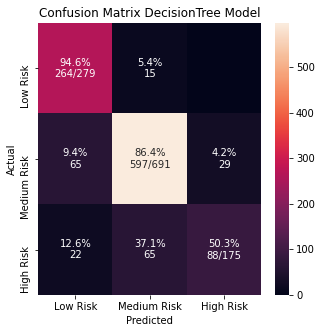

<Figure size 504x576 with 0 Axes>

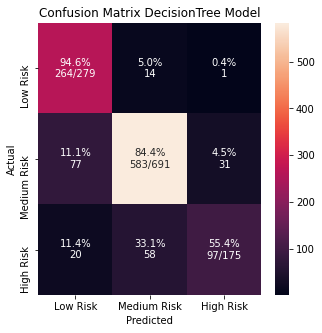

<Figure size 504x576 with 0 Axes>

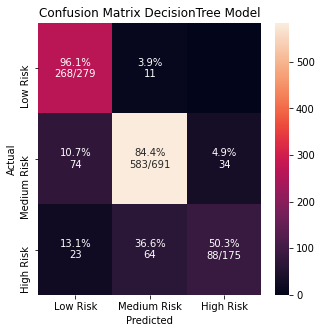

<Figure size 504x576 with 0 Axes>

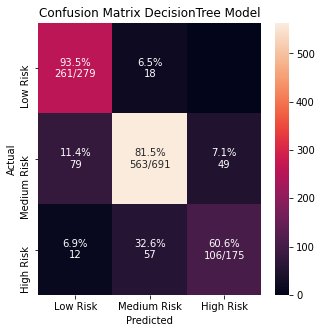

<Figure size 504x576 with 0 Axes>

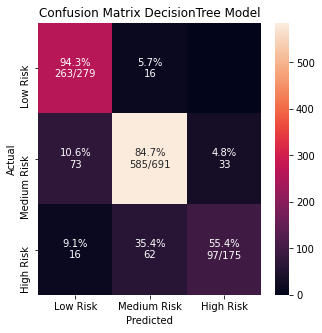

<Figure size 504x576 with 0 Axes>

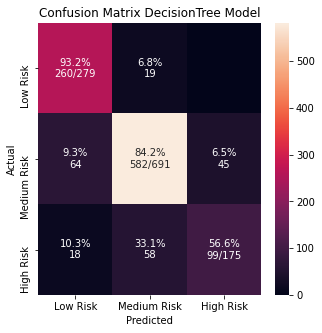

<Figure size 504x576 with 0 Axes>

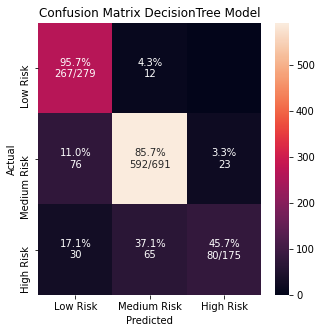

<Figure size 504x576 with 0 Axes>

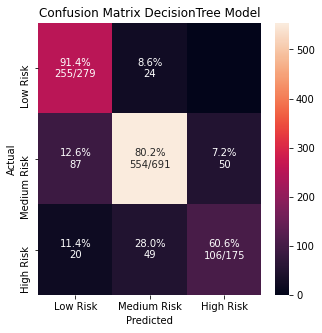

<Figure size 504x576 with 0 Axes>

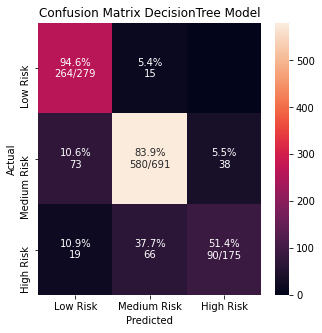

<Figure size 504x576 with 0 Axes>

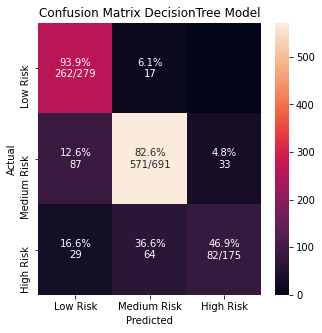

<Figure size 504x576 with 0 Axes>

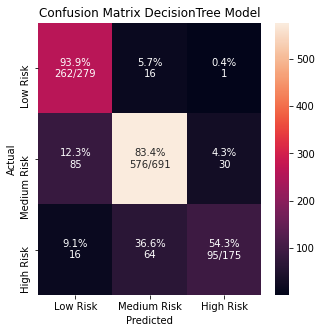

<Figure size 504x576 with 0 Axes>

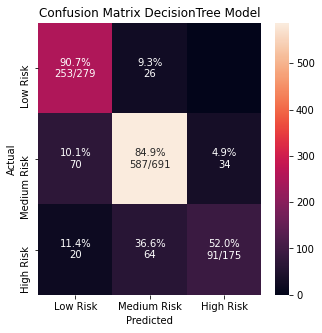

<Figure size 504x576 with 0 Axes>

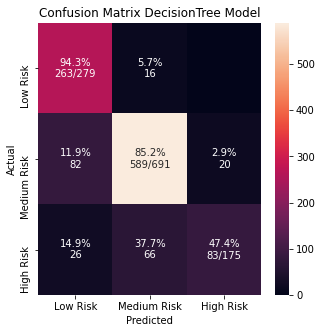

<Figure size 504x576 with 0 Axes>

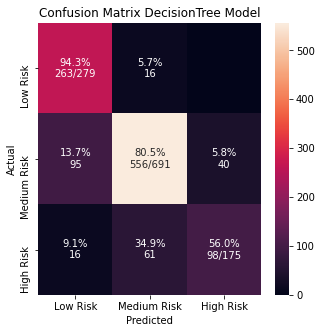

<Figure size 504x576 with 0 Axes>

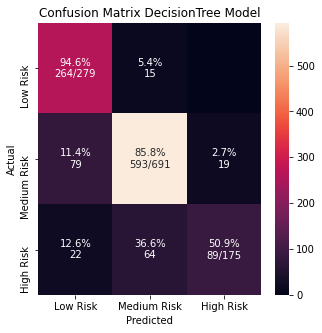

<Figure size 504x576 with 0 Axes>

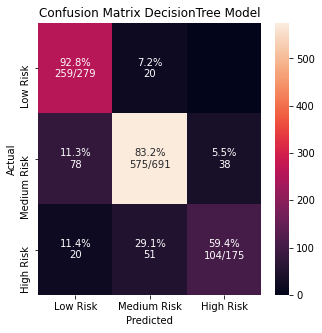

<Figure size 504x576 with 0 Axes>

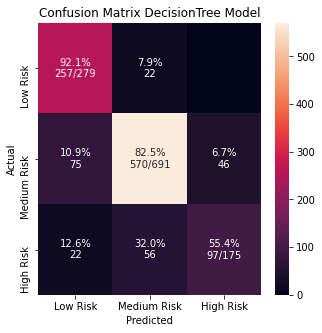

<Figure size 504x576 with 0 Axes>

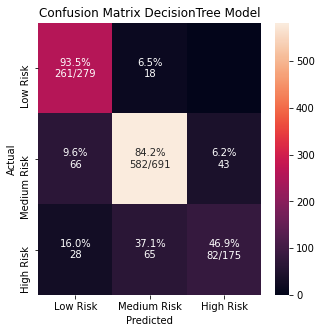

<Figure size 504x576 with 0 Axes>

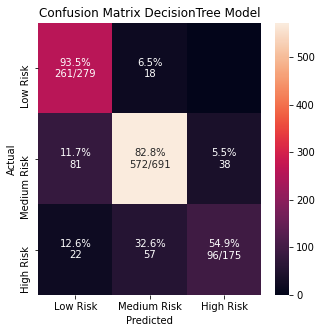

<Figure size 504x576 with 0 Axes>

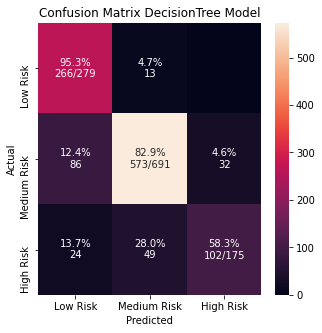

<Figure size 504x576 with 0 Axes>

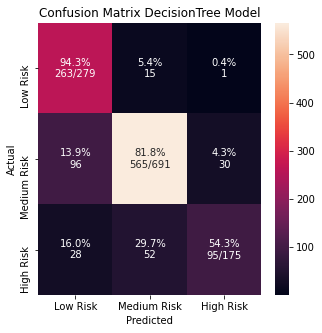

<Figure size 504x576 with 0 Axes>

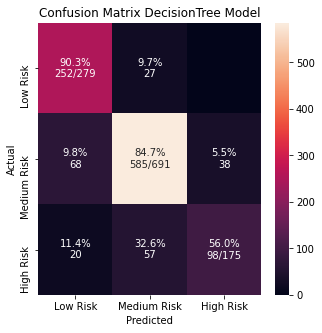

<Figure size 504x576 with 0 Axes>

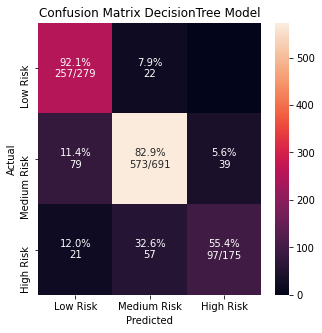

<Figure size 504x576 with 0 Axes>

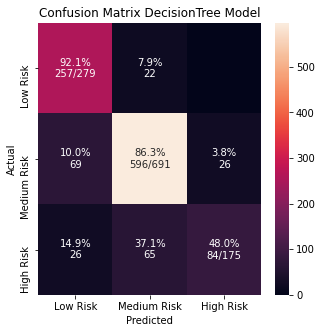

<Figure size 504x576 with 0 Axes>

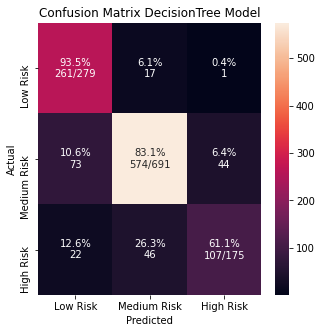

<Figure size 504x576 with 0 Axes>

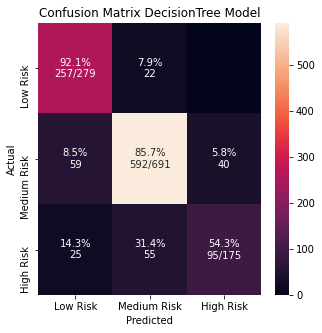

<Figure size 504x576 with 0 Axes>

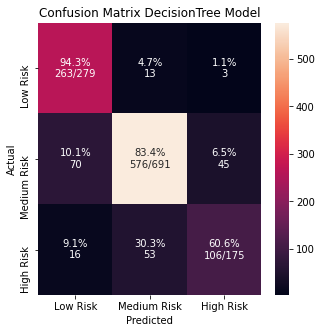

<Figure size 504x576 with 0 Axes>

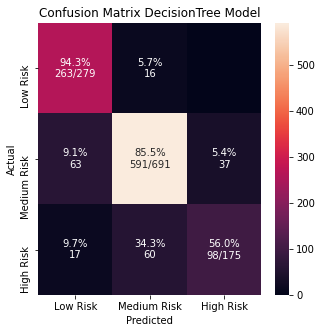

<Figure size 504x576 with 0 Axes>

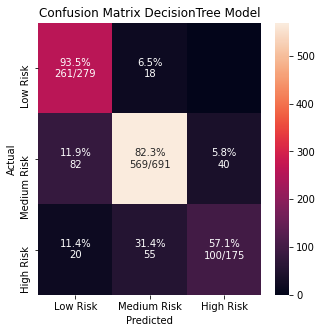

<Figure size 504x576 with 0 Axes>

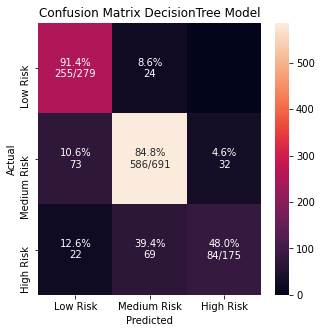

<Figure size 504x576 with 0 Axes>

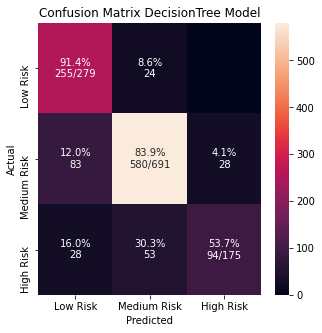

<Figure size 504x576 with 0 Axes>

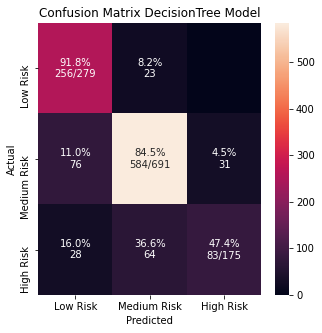

<Figure size 504x576 with 0 Axes>

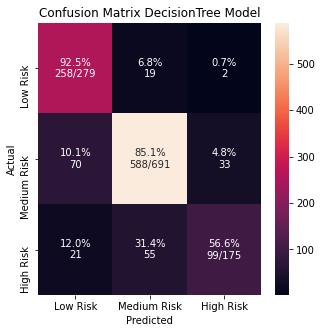

<Figure size 504x576 with 0 Axes>

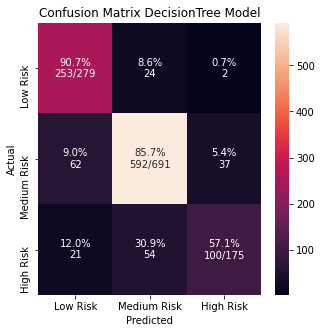

<Figure size 504x576 with 0 Axes>

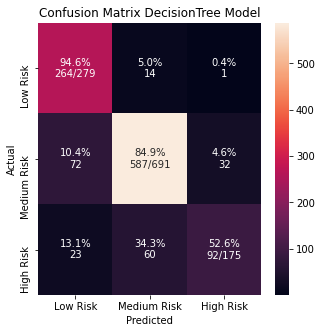

<Figure size 504x576 with 0 Axes>

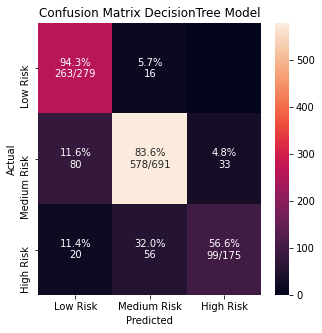

<Figure size 504x576 with 0 Axes>

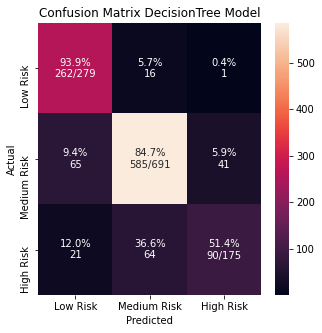

<Figure size 504x576 with 0 Axes>

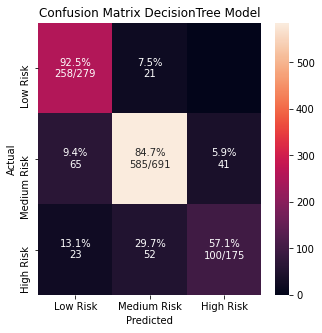

<Figure size 504x576 with 0 Axes>

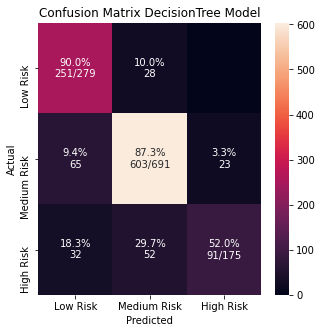

<Figure size 504x576 with 0 Axes>

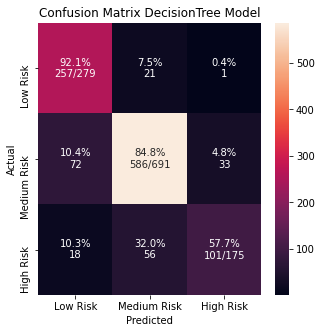

<Figure size 504x576 with 0 Axes>

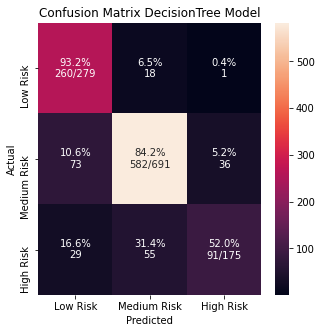

<Figure size 504x576 with 0 Axes>

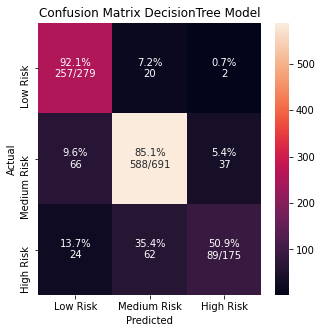

<Figure size 504x576 with 0 Axes>

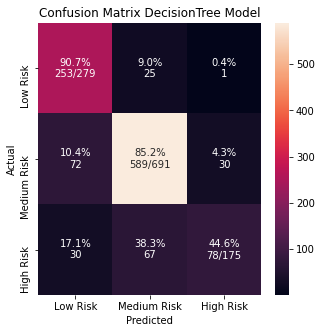

<Figure size 504x576 with 0 Axes>

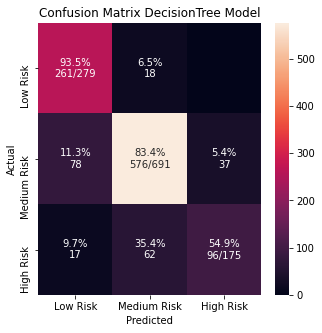

<Figure size 504x576 with 0 Axes>

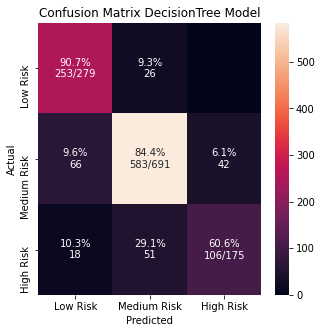

<Figure size 504x576 with 0 Axes>

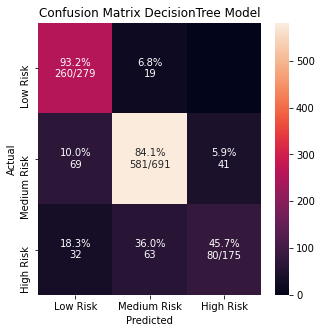

<Figure size 504x576 with 0 Axes>

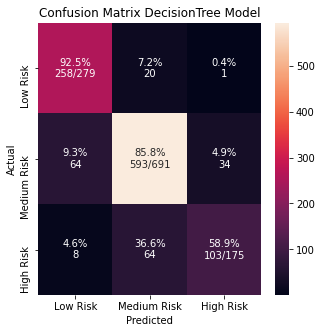

<Figure size 504x576 with 0 Axes>

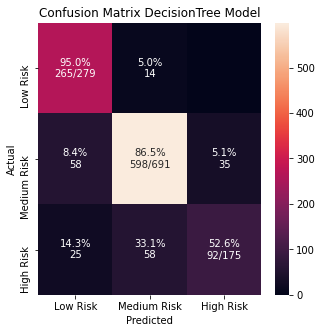

<Figure size 504x576 with 0 Axes>

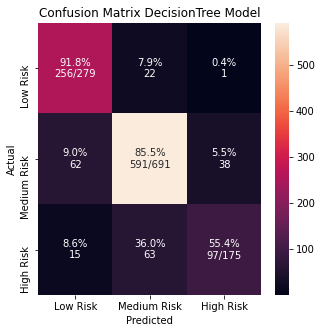

<Figure size 504x576 with 0 Axes>

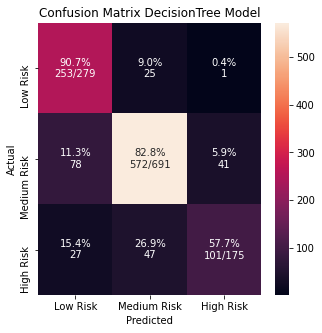

<Figure size 504x576 with 0 Axes>

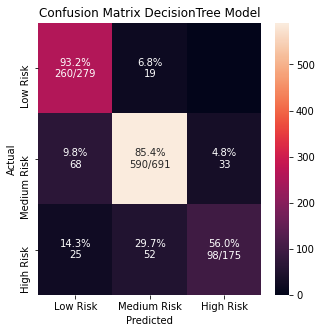

<Figure size 504x576 with 0 Axes>

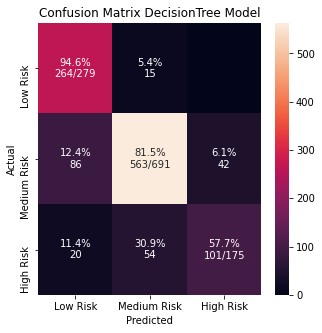

<Figure size 504x576 with 0 Axes>

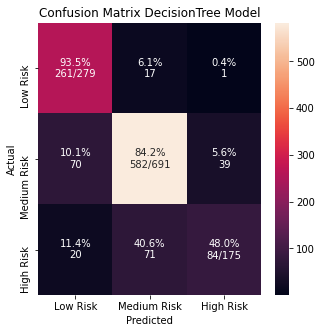

<Figure size 504x576 with 0 Axes>

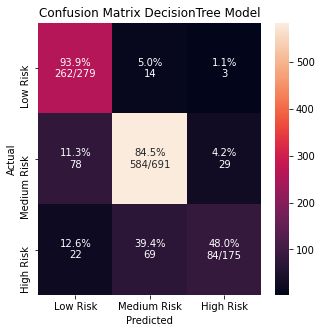

<Figure size 504x576 with 0 Axes>

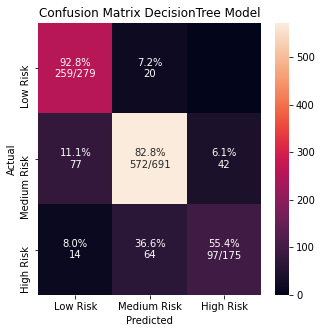

<Figure size 504x576 with 0 Axes>

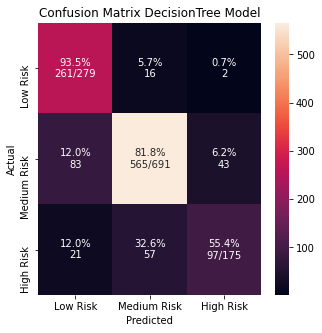

<Figure size 504x576 with 0 Axes>

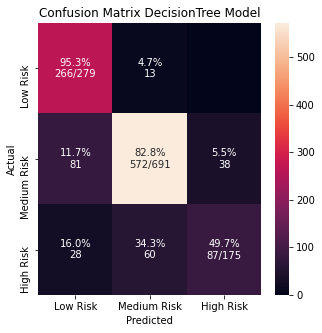

<Figure size 504x576 with 0 Axes>

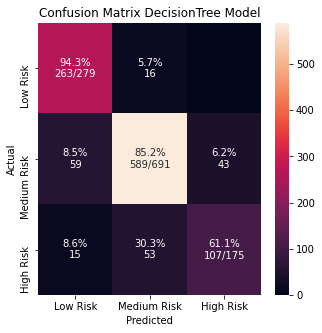

<Figure size 504x576 with 0 Axes>

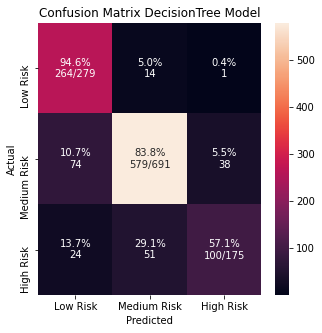

<Figure size 504x576 with 0 Axes>

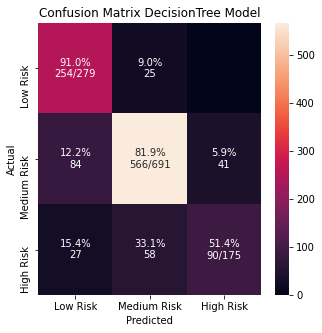

<Figure size 504x576 with 0 Axes>

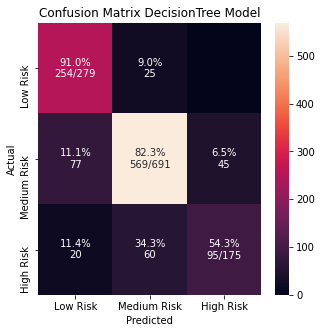

<Figure size 504x576 with 0 Axes>

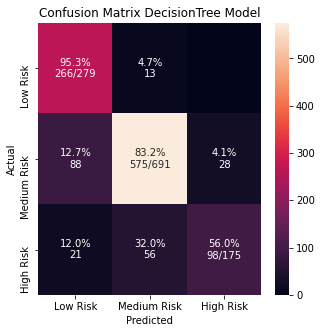

<Figure size 504x576 with 0 Axes>

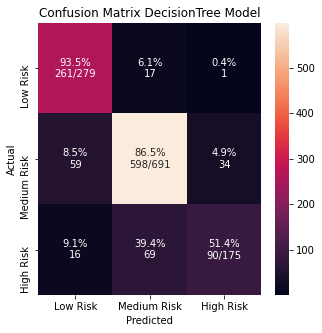

<Figure size 504x576 with 0 Axes>

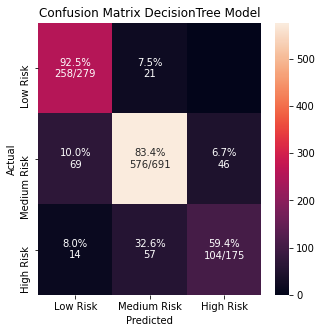

<Figure size 504x576 with 0 Axes>

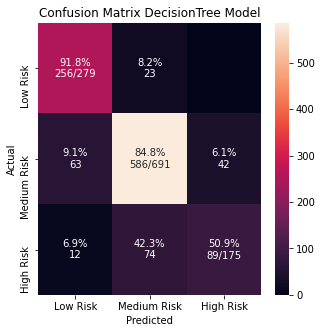

<Figure size 504x576 with 0 Axes>

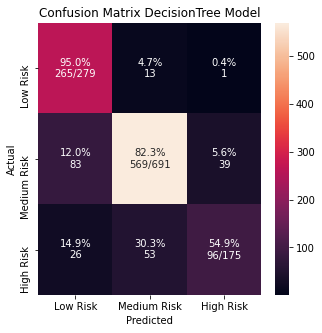

<Figure size 504x576 with 0 Axes>

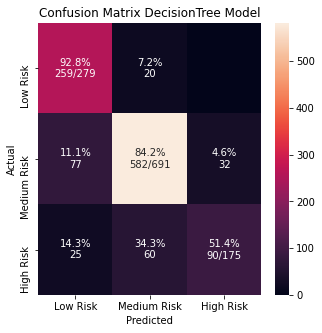

<Figure size 504x576 with 0 Axes>

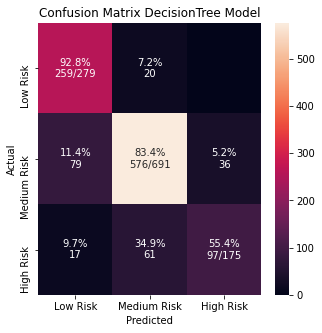

<Figure size 504x576 with 0 Axes>

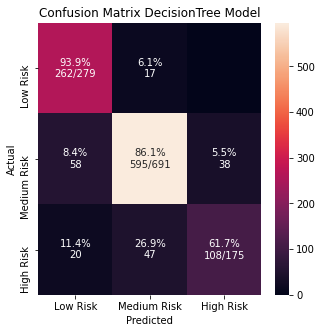

<Figure size 504x576 with 0 Axes>

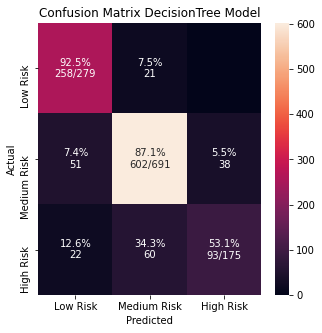

<Figure size 504x576 with 0 Axes>

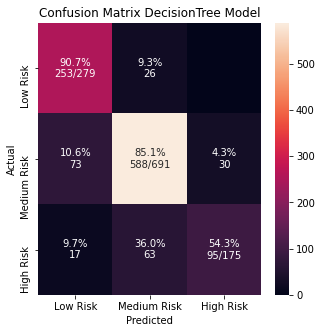

<Figure size 504x576 with 0 Axes>

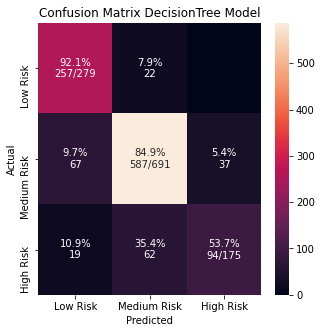

<Figure size 504x576 with 0 Axes>

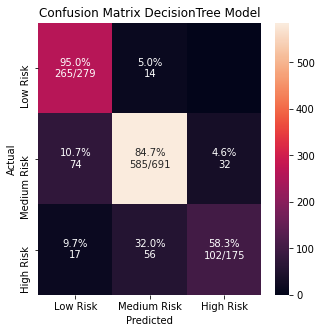

<Figure size 504x576 with 0 Axes>

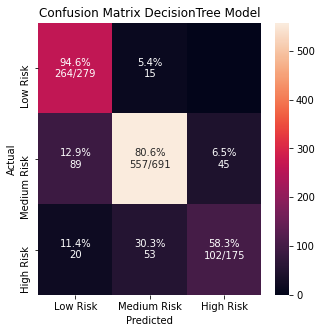

<Figure size 504x576 with 0 Axes>

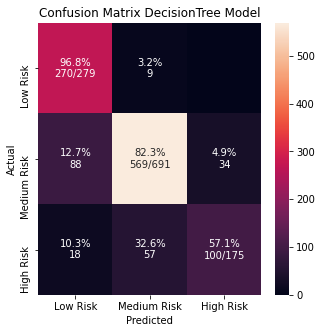

<Figure size 504x576 with 0 Axes>

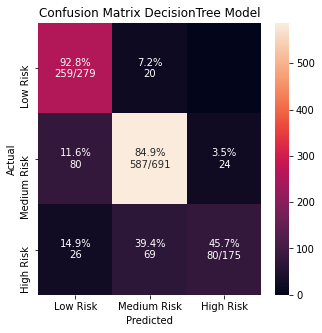

<Figure size 504x576 with 0 Axes>

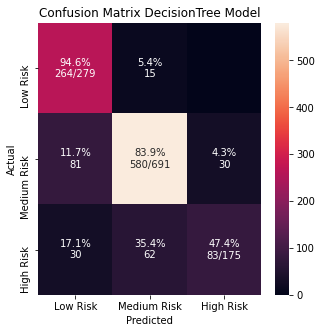

<Figure size 504x576 with 0 Axes>

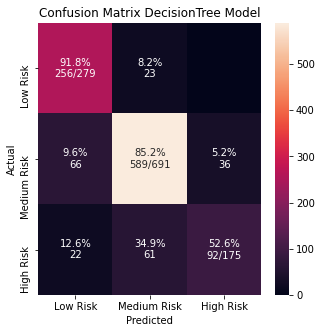

<Figure size 504x576 with 0 Axes>

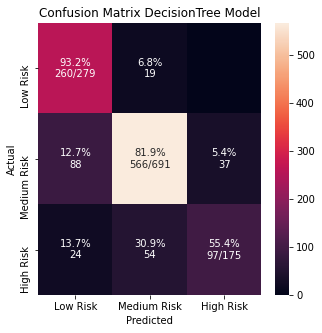

<Figure size 504x576 with 0 Axes>

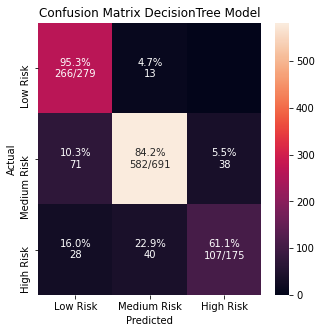

<Figure size 504x576 with 0 Axes>

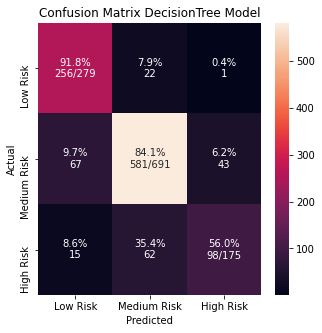

<Figure size 504x576 with 0 Axes>

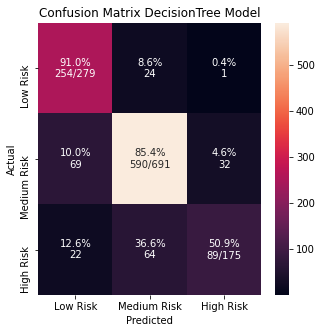

<Figure size 504x576 with 0 Axes>

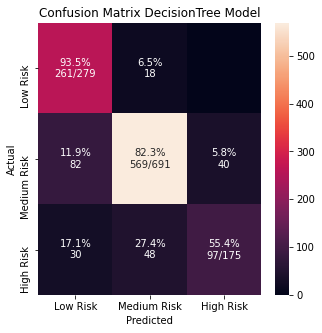

<Figure size 504x576 with 0 Axes>

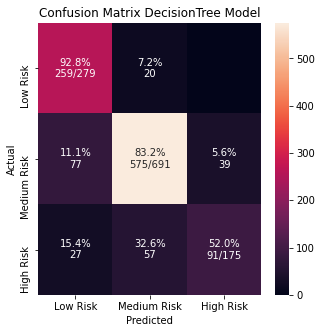

<Figure size 504x576 with 0 Axes>

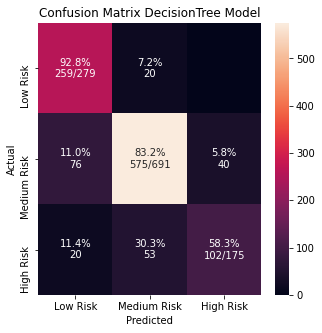

<Figure size 504x576 with 0 Axes>

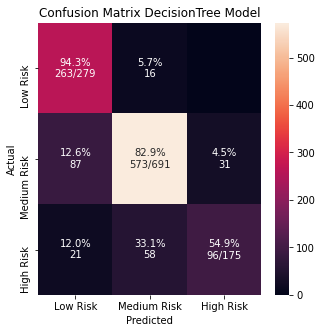

<Figure size 504x576 with 0 Axes>

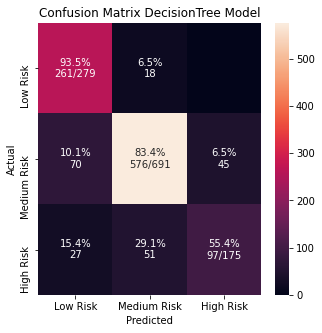

<Figure size 504x576 with 0 Axes>

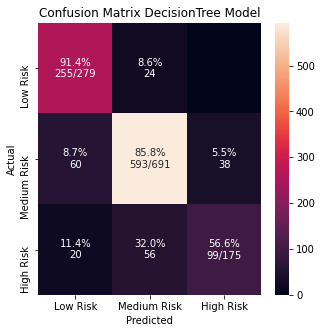

<Figure size 504x576 with 0 Axes>

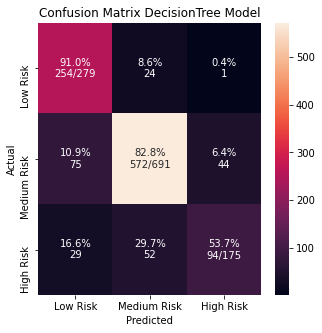

<Figure size 504x576 with 0 Axes>

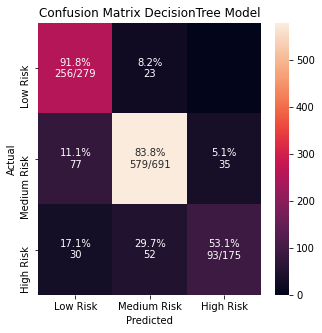

<Figure size 504x576 with 0 Axes>

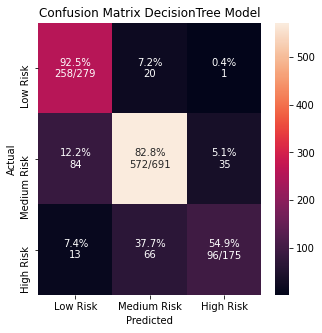

<Figure size 504x576 with 0 Axes>

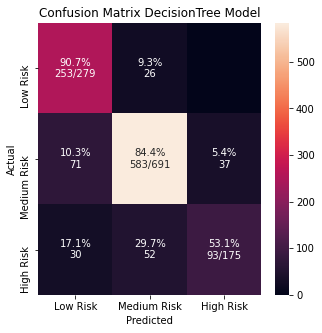

<Figure size 504x576 with 0 Axes>

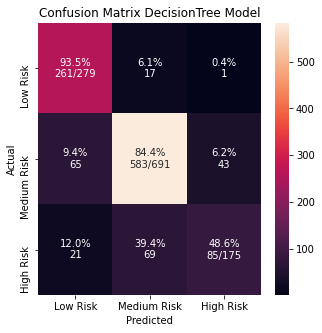

<Figure size 504x576 with 0 Axes>

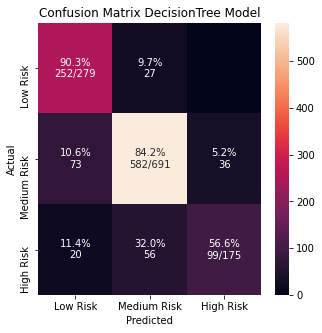

<Figure size 504x576 with 0 Axes>

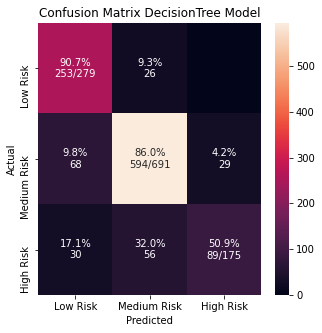

<Figure size 504x576 with 0 Axes>

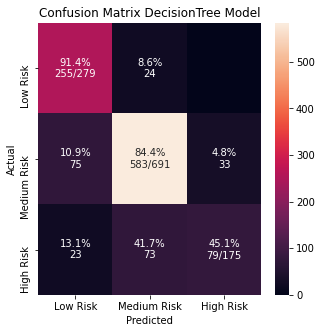

<Figure size 504x576 with 0 Axes>

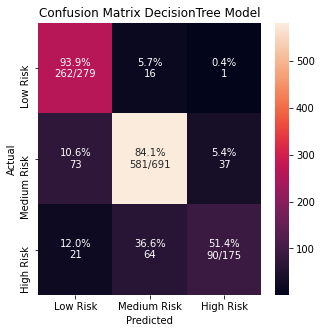

<Figure size 504x576 with 0 Axes>

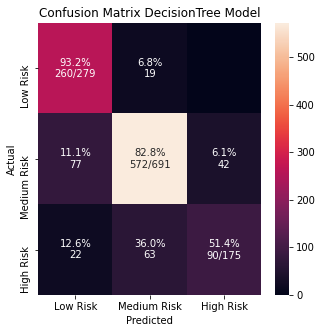

<Figure size 504x576 with 0 Axes>

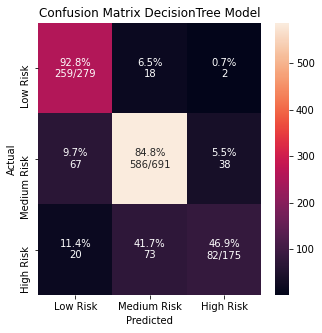

<Figure size 504x576 with 0 Axes>

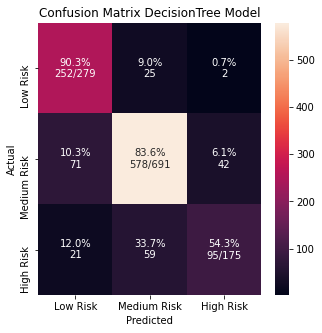

<Figure size 504x576 with 0 Axes>

interval_accuracy_start 0.7534467921341509
interval_accuracy_end 0.8016274436737091
mean accuracy 0.77753711790393
interval_recall_start 0.8201916687519821
interval_recall_end 0.862515754828804
avg_recall 0.8413537117903931
interval_precision_start 0.7328087001311023
interval_precision_end 0.7824509485711577
avg_precision 0.75762982435113
interval_f1_start 0.8181760978495343
interval_f1n_end 0.860706121073419
avg_f1 0.8394411094614767
interval_AUC_start 0.8336718053387489
interval_AUC_end 0.8745642505774034
avg_auc 0.8541180279580761


In [625]:


list_accuracy_score=[]
list_recall_score=[]
list_precision_score=[]
list_f1_score=[]
list_AUC=[]
for i in range(100):
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, train_size=0.8,test_size=0.2 , stratify=y)
    output,n,precision,recall,f1,AUC=applying_ML(X_train, Y_train, X_test, Y_test, 'DecisionTree', 'DecisionTree',depth=None, Cvalue=1,alphaValue=0.0)
    list_accuracy_score.append(output)
    list_recall_score.append(recall)
    list_precision_score.append(precision)
    list_f1_score.append(f1)
    list_AUC.append(AUC)
avg_accuracy = (mean(list_accuracy_score))
avg_recall = (mean(list_recall_score))
avg_precision = (mean(list_precision_score))
avg_f1=(mean(list_f1_score))
avg_AUC=(mean(list_AUC))

interval_accuracy_end=avg_accuracy + 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_accuracy_start=avg_accuracy - 1.96 * sqrt( (avg_accuracy * (1 - avg_accuracy)) / n)
interval_recall_end=avg_recall + 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_recall_start=avg_recall - 1.96 * sqrt( (avg_recall * (1 - avg_recall)) / n)
interval_precision_end=avg_precision + 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_precision_start=avg_precision - 1.96 * sqrt( (avg_precision * (1 - avg_precision)) / n)
interval_f1_end=avg_f1 + 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)
interval_f1_start=avg_f1 - 1.96 * sqrt( (avg_f1 * (1 - avg_f1)) / n)

interval_AUC_end=avg_AUC + 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)
interval_AUC_start=avg_AUC - 1.96 * sqrt( (avg_AUC * (1 - avg_AUC)) / n)

print("interval_accuracy_start", interval_accuracy_start)
print("interval_accuracy_end",interval_accuracy_end)
print("mean accuracy",avg_accuracy)


print("interval_recall_start", interval_recall_start)
print("interval_recall_end",interval_recall_end)
print("avg_recall",avg_recall)


print("interval_precision_start", interval_precision_start)
print("interval_precision_end",interval_precision_end)
print("avg_precision",avg_precision)


print("interval_f1_start", interval_f1_start)
print("interval_f1n_end",interval_f1_end)
print("avg_f1",avg_f1)

print("interval_AUC_start", interval_AUC_start)
print("interval_AUC_end",interval_AUC_end)
print("avg_auc",avg_AUC)